In [2]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import functools

from torch.optim import Adam
from torch.utils.data import DataLoader
import torchvision.transforms as transforms
from torchvision.datasets import MNIST,CIFAR10
import tqdm
from tqdm.notebook import trange, tqdm
from torch.optim.lr_scheduler import MultiplicativeLR, LambdaLR

import matplotlib.pyplot as plt

from torchvision.utils import make_grid

### Time Step Encoding using Gaussian Fourier Projection

In [3]:
class GaussianFourierProjection(nn.Module):
    
    """Gaussian random features for encoding time steps."""
    
    def __init__(self, embed_dim, scale=30.):
        super().__init__()
        
        # Randomly sample weights (frequencies) during initialization.
        # These weights (frequencies) are fixed during optimization and are not trainable.
        self.W = nn.Parameter(torch.randn(embed_dim // 2) * scale, requires_grad=False)
        
    def forward(self, x):
        # Cosine(2 pi freq x), Sine(2 pi freq x)
        
        # Project the input x using randomly sampled frequencies (weights) W.
        x_proj = x[:, None] * self.W[None, :] * 2 * np.pi
        
        return torch.cat([torch.sin(x_proj), torch.cos(x_proj)], dim=-1)

class Dense(nn.Module):
    
    """A fully connected layer that reshapes outputs to feature maps.
      Allow time repr to input additively from the side of a convolution layer.
    """
    
    def __init__(self, input_dim, output_dim):
        super().__init__()
        
        # Define a fully connected layer with input_dim and output_dim.
        self.dense = nn.Linear(input_dim, output_dim)
        
    def forward(self, x):
        # Pass input x through the fully connected layer and reshape the output to 4D tensor.
        return self.dense(x)[..., None, None]  # 2D to 4D 

### Noise Function

In [4]:
# Set the device for computation.
device = 'cuda:0'

# Set the value for the parameter sigma.
sigma = 25

def marginal_prob_std(t, sigma):
    
    """Computing the mean and standard deviation of $p_{0t}(x(t) | x(0))$.
    Args:
    t: A vector of time steps.
    sigma: The $\sigma$ in our SDE."""
    
    # Convert time steps to a PyTorch tensor with the specified device.
    t = torch.tensor(t, device=device)
    
    # Compute and return the standard deviation of the marginal probability.
    return torch.sqrt((sigma**(2 * t) - 1.) / 2. / np.log(sigma))

def diffusion_coeff(t, sigma):
    
    """Computing the diffusion coefficient of our SDE.
    Args:
    t: A vector of time steps.
    sigma: The $\sigma$ in our SDE."""
    
    # Compute and return the diffusion coefficient based on the provided time steps and sigma.
    return torch.tensor(sigma**t, device=device)

# Create partial functions with fixed sigma for marginal probability and diffusion coefficient.
marginal_prob_std_fn = functools.partial(marginal_prob_std, sigma=sigma)
diffusion_coeff_fn = functools.partial(diffusion_coeff, sigma=sigma)

## Unconditional DDPM

### Loss Function for Denoising

In [5]:
# Loss Function for unconditional denoising
def loss_fn_uncond(model, x, marginal_prob_std, eps=1e-5):

    # Sample time uniformly in the interval [eps, 1 - eps]
    random_t = torch.rand(x.shape[0], device=x.device) * (1. - eps) + eps
    
    # Finding the noise standard deviation at the sampled time `t`
    std = marginal_prob_std(random_t)
    
    # Generate normally distributed noise
    z = torch.randn_like(x, dtype=torch.float32)
    
    # Perturb the input data using the sampled noise and computed standard deviation
    perturbed_x = x + std[:, None, None, None] * z
    
    # Obtain the model's prediction on the perturbed data at the sampled time
    score = model(perturbed_x, random_t)
    
    # Compute the loss as the mean squared difference between the predicted score and perturbed data
    loss = torch.mean(torch.sum((score * std[:, None, None, None] + z)**2, dim=(1, 2, 3)))
    
    return loss

### U-Net Architecture for MNIST

In [6]:
class UNet_mnist(nn.Module):

    def __init__(self, marginal_prob_std, channels=[32, 64, 128, 256], embed_dim=256):
    
        super().__init__()
        
        # Gaussian feature embedding layer
        self.time_embed = nn.Sequential(
            GaussianFourierProjection(embed_dim=embed_dim),
            nn.Linear(embed_dim, embed_dim)
        )
        
        # Encoding layers
        self.conv1 = nn.Conv2d(1, channels[0], 3, stride=1, bias=False)  # Input: 1 channel, Output: channels[0]
        self.dense1 = Dense(embed_dim, channels[0])
        self.gnorm1 = nn.GroupNorm(4, num_channels=channels[0])  # 4 groups for group normalization

        self.conv2 = nn.Conv2d(channels[0], channels[1], 3, stride=2, bias=False)  # Input: channels[0], Output: channels[1]
        self.dense2 = Dense(embed_dim, channels[1])
        self.gnorm2 = nn.GroupNorm(32, num_channels=channels[1])  # 32 groups for group normalization

        self.conv3 = nn.Conv2d(channels[1], channels[2], 3, stride=2, bias=False)  # Input: channels[1], Output: channels[2]
        self.dense3 = Dense(embed_dim, channels[2])
        self.gnorm3 = nn.GroupNorm(32, num_channels=channels[2])  # 32 groups for group normalization

        self.conv4 = nn.Conv2d(channels[2], channels[3], 3, stride=2, bias=False)  # Input: channels[2], Output: channels[3]
        self.dense4 = Dense(embed_dim, channels[3])
        self.gnorm4 = nn.GroupNorm(32, num_channels=channels[3])  # 32 groups for group normalization
        
        # Decoding layers
        self.tconv4 = nn.ConvTranspose2d(channels[3], channels[2], 3, stride=2, bias=False)  # Input: channels[3], Output: channels[2]
        self.dense5 = Dense(embed_dim, channels[2])
        self.tgnorm4 = nn.GroupNorm(32, num_channels=channels[2])  # 32 groups for group normalization
        self.tconv3 = nn.ConvTranspose2d(channels[2], channels[1], 3, stride=2, bias=False, output_padding=1)  # Input: channels[2], Output: channels[1]
        self.dense6 = Dense(embed_dim, channels[1])
        self.tgnorm3 = nn.GroupNorm(32, num_channels=channels[1])  # 32 groups for group normalization
        self.tconv2 = nn.ConvTranspose2d(channels[1], channels[0], 3, stride=2, bias=False, output_padding=1)  # Input: channels[1], Output: channels[0]
        self.dense7 = Dense(embed_dim, channels[0])
        self.tgnorm2 = nn.GroupNorm(32, num_channels=channels[0])  # 32 groups for group normalization
        self.tconv1 = nn.ConvTranspose2d(channels[0], 1, 3, stride=1)  # Input: channels[0], Output: 1 channel
        
        # The swish activation function
        self.act = lambda x: x * torch.sigmoid(x)
        self.marginal_prob_std = marginal_prob_std
        
    def forward(self, x, t, y=None):
        
        embed = self.act(self.time_embed(t))  # Gaussian feature embedding
        
        # Encoder
        h1 = self.conv1(x) + self.dense1(embed)
        h1 = self.act(self.gnorm1(h1))
        h2 = self.conv2(h1) + self.dense2(embed)
        h2 = self.act(self.gnorm2(h2))
        h3 = self.conv3(h2) + self.dense3(embed)
        h3 = self.act(self.gnorm3(h3))
        h4 = self.conv4(h3) + self.dense4(embed)
        h4 = self.act(self.gnorm4(h4))
        
        # Decoder
        h = self.tconv4(h4) + self.dense5(embed)
        h = self.act(self.tgnorm4(h))
        h = self.tconv3(h + h3) + self.dense6(embed)
        h = self.act(self.tgnorm3(h))
        k = self.dense7(embed)
        h = self.tconv2(h + h2) + k
        h = self.act(self.tgnorm2(h))
        h = self.tconv1(h + h1)
        
        # Normalize output
        h = h / self.marginal_prob_std(t)[:, None, None, None]
        return h


### Sampler for Generating Images using Random Noise

In [41]:
# Euler Maruyama Sampler code
num_steps = 1000

def Euler_Maruyama_sampler_mnist(score_model,
              marginal_prob_std,
              diffusion_coeff,
              batch_size=64,
              x_shape=(1, 28, 28),
              num_steps=num_steps,
              device='cuda:0',
              eps=1e-3, y=None):
    
    # Initialize time and random initial samples
    t = torch.ones(batch_size, device=device)  # Set initial time
    init_x = torch.randn(batch_size, *x_shape, device=device) \
    * marginal_prob_std(t)[:, None, None, None]  # Generate random initial samples
    
    # Define time steps and step size
    time_steps = torch.linspace(1., eps, num_steps, device=device)  # Generate time steps
    step_size = time_steps[0] - time_steps[1]  # Calculate step size
    x = init_x
    
    # Perform Euler Maruyama sampling
    with torch.no_grad():
        for time_step in tqdm(time_steps):
            batch_time_step = torch.ones(batch_size, device=device) * time_step  # Set current time step
            g = diffusion_coeff(batch_time_step)  # Compute diffusion coefficient at the current time step
            mean_x = x + (g**2)[:, None, None, None] * score_model(x, batch_time_step, y=y) * step_size  # Euler-Maruyama update
            x = mean_x + torch.sqrt(step_size) * g[:, None, None, None] * torch.randn_like(x)  # Update samples
            
    return mean_x


### Training Loop for MNIST

In [ ]:
# Training on MNIST dataset for unconditional denoising

from tqdm import tqdm
from torchvision.utils import save_image, make_grid
from torchvision import datasets, transforms
import matplotlib.pyplot as plt

# Initialize a UNet model for unconditional denoising
score_model = torch.nn.DataParallel(UNet_mnist(marginal_prob_std=marginal_prob_std_fn))
score_model = score_model.to(device)

# Number of epochs
epochs = 100
# Size of a mini-batch
batch_size = 256
# Learning rate
lr = 5e-4

# Load MNIST dataset and create a data loader
dataset = MNIST('.', train=True, transform=transforms.ToTensor(), download=True)
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=4)

# Initialize Adam optimizer for the model parameters
optimizer = Adam(score_model.parameters())
tqdm_epoch = trange(epochs)

# List to store the training loss for each epoch
loss_mnist = []

# Training loop
for epoch in tqdm_epoch:
    avg_loss = 0.
    num_items = 0
    
    # Iterate through the data loader
    for x, y in tqdm(dataloader):
        x = x.to(device)
        # Compute the loss for unconditional denoising
        loss = loss_fn_uncond(score_model, x, marginal_prob_std_fn)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        avg_loss += loss.item() * x.shape[0]
        num_items += x.shape[0]
        
        # Print the averaged training loss so far
        tqdm_epoch.set_description('Average Loss: {:5f}'.format(avg_loss / num_items))
        # Update the checkpoint after each epoch of training
        torch.save(score_model.state_dict(), 'ckpt.pth')
    
    # Store the average loss for the epoch
    loss_mnist.append(avg_loss)
    
    ## Sample generation
    with torch.no_grad():
    
        sample_batch_size = 64 
        num_steps = 500 
        sampler = Euler_Maruyama_sampler_mnist 
        
        # Generate samples using the specified sampler
        samples = sampler(score_model,
                  marginal_prob_std_fn,
                  diffusion_coeff_fn,
                  sample_batch_size,
                  num_steps=num_steps,
                  device=device,
                  y=None)
        
        # Clamp the generated samples to be within [0.0, 1.0]
        samples = samples.clamp(0.0, 1.0)
        %matplotlib inline
        # Create a grid of sample images for visualization
        sample_grid = make_grid(samples, nrow=int(np.sqrt(sample_batch_size)))
        # Save the sample grid as an image
        save_image(sample_grid, f"./final/ddpm_MNIST{epoch}.png")

  0%|          | 0/100 [00:00<?, ?it/s]


  0%|                                                                                              | 0/235 [00:00<?, ?it/s]/tmp/ipykernel_70766/2309205034.py:11: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(t, device=device)

100%|████████████████████████████████████████████████████████████████████████████████████| 235/235 [00:05<00:00, 46.90it/s]

  0%|                                                                                              | 0/500 [00:00<?, ?it/s]/tmp/ipykernel_70766/2309205034.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(sigma**t, device=device)

100%|███████████████████████████████████████████████████████████████████

### Sample Output Images

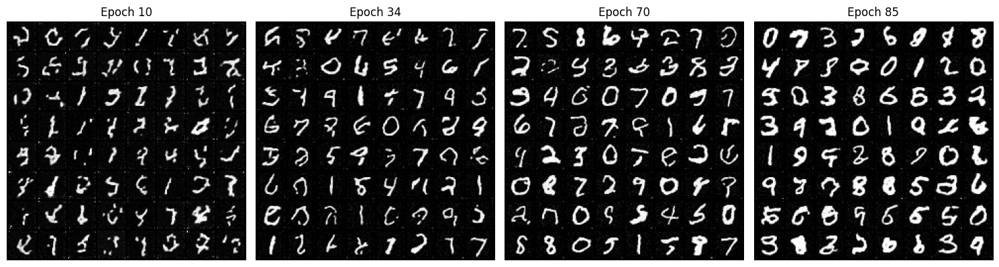

In [7]:
import matplotlib.pyplot as plt
from PIL import Image

# Specify the file paths of the four images
image_paths = [
    "ddpm_MNIST10.png",
    "ddpm_MNIST34.png",
    "ddpm_MNIST70.png",
    "ddpm_MNIST85.png",
]

# Create a figure with four subplots
fig, axs = plt.subplots(1, 4, figsize=(15, 5))

# Loop through each image path and display it in a subplot
for i, path in enumerate(image_paths):
    # Open the image using PIL
    img = Image.open(path)
    
    # Display the image in the corresponding subplot
    axs[i].imshow(img)
    axs[i].axis('off')
    

# Adjust layout to prevent overlapping
axs[0].set_title(f"Epoch 10")
axs[1].set_title(f"Epoch 34")
axs[2].set_title(f"Epoch 70")
axs[3].set_title(f"Epoch 85")
plt.tight_layout()
plt.show()


### Loss per epoch for MNIST

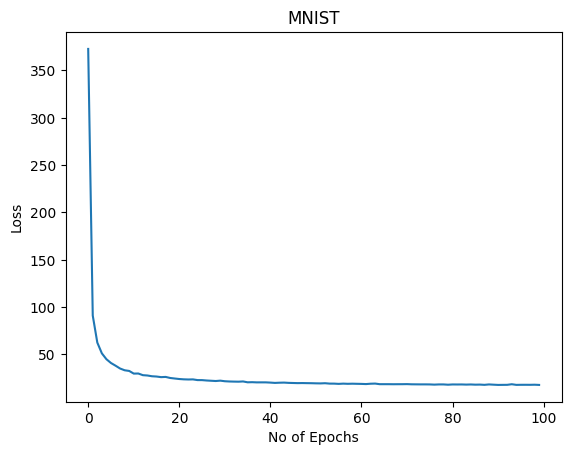

In [ ]:
# Normalize the training loss by the number of training samples
loss_mnist = np.array(loss_mnist) / 57000

# Plot the normalized training loss
plt.plot(loss_mnist)
plt.xlabel("No of Epochs")
plt.ylabel("Loss")
plt.title("MNIST")
plt.show()

### U-Net Architecture for FashionMNIST

In [ ]:
#------------------------------------U-net Architecture for FashionMNIST---------------------------

class UNet_Fashionmnist(nn.Module):

    def __init__(self, marginal_prob_std, channels=[32, 64, 128, 256], embed_dim=256):
    
        super().__init__()
        
        # Gaussian feature embedding layer
        self.time_embed = nn.Sequential(
            GaussianFourierProjection(embed_dim=embed_dim),
            nn.Linear(embed_dim, embed_dim)
        )
        
        # Encoding layers
        self.conv0 = nn.Conv2d(1, channels[0], 3, stride=1, bias=False, padding='same')  # Input: 1 channel, Output: channels[0]
        self.dense0 = Dense(embed_dim, channels[0])  # Input: embed_dim, Output: channels[0]
        self.gnorm0 = nn.GroupNorm(4, num_channels=channels[0])  # 4 groups for group normalization
        
        self.conv1 = nn.Conv2d(channels[0], channels[0], 3, stride=1, bias=False)  # Input: channels[0], Output: channels[0]
        self.dense1 = Dense(embed_dim, channels[0])  # Input: embed_dim, Output: channels[0]
        self.gnorm1 = nn.GroupNorm(4, num_channels=channels[0])  # 4 groups for group normalization

        self.conv2 = nn.Conv2d(channels[0], channels[1], 3, stride=2, bias=False)  # Input: channels[0], Output: channels[1]
        self.dense2 = Dense(embed_dim, channels[1])  # Input: embed_dim, Output: channels[1]
        self.gnorm2 = nn.GroupNorm(32, num_channels=channels[1])  # 32 groups for group normalization

        self.conv3 = nn.Conv2d(channels[1], channels[2], 3, stride=2, bias=False)  # Input: channels[1], Output: channels[2]
        self.dense3 = Dense(embed_dim, channels[2])  # Input: embed_dim, Output: channels[2]
        self.gnorm3 = nn.GroupNorm(32, num_channels=channels[2])  # 32 groups for group normalization
        
        self.conv4 = nn.Conv2d(channels[2], channels[3], 3, stride=2, bias=False)  # Input: channels[2], Output: channels[3]
        self.dense4 = Dense(embed_dim, channels[3])  # Input: embed_dim, Output: channels[3]
        self.gnorm4 = nn.GroupNorm(32, num_channels=channels[3])  # 32 groups for group normalization
        
        
        # Decoding layers
        self.tconv4 = nn.ConvTranspose2d(channels[3], channels[2], 3, stride=2, bias=False)  # Input: channels[3], Output: channels[2]
        self.dense5 = Dense(embed_dim, channels[2])  # Input: embed_dim, Output: channels[2]
        self.tgnorm4 = nn.GroupNorm(32, num_channels=channels[2])  # 32 groups for group normalization
        
        self.tconv3 = nn.ConvTranspose2d(channels[2], channels[1], 3, stride=2, bias=False, output_padding=1)  # Input: channels[2], Output: channels[1]
        self.dense6 = Dense(embed_dim, channels[1])  # Input: embed_dim, Output: channels[1]
        self.tgnorm3 = nn.GroupNorm(32, num_channels=channels[1])  # 32 groups for group normalization

        self.tconv2 = nn.ConvTranspose2d(channels[1], channels[0], 3, stride=2, bias=False, output_padding=1)  # Input: channels[1], Output: channels[0]
        self.dense7 = Dense(embed_dim, channels[0])  # Input: embed_dim, Output: channels[0]
        self.tgnorm2 = nn.GroupNorm(32, num_channels=channels[0])  # 32 groups for group normalization

        self.tconv1 = nn.ConvTranspose2d(channels[0], 1, 3, stride=1)  # Input: channels[0], Output: 1 channel
        
        # The swish activation function
        self.act = lambda x: x * torch.sigmoid(x)
        self.marginal_prob_std = marginal_prob_std
        
    def forward(self, x, t, y=None):
        
        embed = self.act(self.time_embed(t))  # Gaussian feature embedding
        
        # Encoder
        h0 = self.conv0(x) + self.dense0(embed)  # Input: x, Output: channels[0]
        h0 = self.act(self.gnorm0(h0))
        h1 = self.conv1(h0) + self.dense1(embed)  # Input: h0, Output: channels[0]
        h1 = self.act(self.gnorm1(h1))
        h2 = self.conv2(h1) + self.dense2(embed)  # Input: h1, Output: channels[1]
        h2 = self.act(self.gnorm2(h2))
        h3 = self.conv3(h2) + self.dense3(embed)  # Input: h2, Output: channels[2]
        h3 = self.act(self.gnorm3(h3))
        h4 = self.conv4(h3) + self.dense4(embed)  # Input: h3, Output: channels[3]
        h4 = self.act(self.gnorm4(h4))
        
        # Decoder
        h = self.tconv4(h4) + self.dense5(embed)  # Input: h4, Output: channels[2]
        h = self.act(self.tgnorm4(h))
        h = self.tconv3(h + h3) + self.dense6(embed)  # Input: h + h3, Output: channels[1]
        h = self.act(self.tgnorm3(h))
        k = self.dense7(embed)  # Input: embed_dim, Output: channels[0]
        h = self.tconv2(h + h2) + k  # Input: h + h2, Output: channels[0]
        h = self.act(self.tgnorm2(h))
        h = self.tconv1(h + h1)  # Input: h + h1, Output: 1 channel
        
        # Normalize output
        h = h / self.marginal_prob_std(t)[:, None, None, None]
        return h

### Training Loop for FashionMNIST

In [35]:
# Training on FashionMNIST dataset for unconditional denoising

from tqdm import tqdm
from torchvision.utils import save_image, make_grid
from torchvision import datasets, transforms
import matplotlib.pyplot as plt

# Initialize a UNet model for unconditional denoising on FashionMNIST
score_model = torch.nn.DataParallel(UNet_Fashionmnist(marginal_prob_std=marginal_prob_std_fn))
score_model = score_model.to(device)

# Number of epochs
epochs = 50
# Size of a mini-batch
batch_size = 256
# Learning rate
lr = 5e-4

# Load FashionMNIST dataset and create a data loader
dataset = datasets.FashionMNIST('.', train=True, transform=transforms.ToTensor(), download=True)
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=4)

# Initialize Adam optimizer for the model parameters
optimizer = Adam(score_model.parameters())
tqdm_epoch = trange(epochs)

# List to store the training loss for each epoch
loss_fashionmnist_ = []

# Training loop
for epoch in tqdm_epoch:
    avg_loss = 0.
    num_items = 0
    
    # Iterate through the data loader
    for x, y in tqdm(dataloader):
        x = x.to(device)
        # Compute the loss for unconditional denoising
        loss = loss_fn_uncond(score_model, x, marginal_prob_std_fn)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        avg_loss += loss.item() * x.shape[0]
        num_items += x.shape[0]
        # Print the averaged training loss so far
        tqdm_epoch.set_description('Average Loss: {:5f}'.format(avg_loss / num_items))
        # Update the checkpoint after each epoch of training
        torch.save(score_model.state_dict(), 'ckpt.pth')
    
    # Store the average loss for the epoch
    loss_fashionmnist_.append(avg_loss)
    
    ## Sample generation
    with torch.no_grad():
    
        sample_batch_size = 64 
        num_steps = 500 
        sampler = Euler_Maruyama_sampler_mnist 
        
        # Generate samples using the specified sampler
        samples = sampler(score_model,
                  marginal_prob_std_fn,
                  diffusion_coeff_fn,
                  sample_batch_size,
                  num_steps=num_steps,
                  device=device,
                  y=None)
        
        # Clamp the generated samples to be within [0.0, 1.0]
        samples = samples.clamp(0.0, 1.0)
        %matplotlib inline
        # Create a grid of sample images for visualization
        sample_grid = make_grid(samples, nrow=int(np.sqrt(sample_batch_size)))
        # Save the sample grid as an image
        save_image(sample_grid, f"./final/ddpm_FashionMNIST{epoch}.png")

  0%|          | 0/50 [00:00<?, ?it/s]


  0%|                                                                                              | 0/235 [00:00<?, ?it/s]/tmp/ipykernel_70766/2309205034.py:11: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(t, device=device)

  4%|███▎                                                                                  | 9/235 [00:00<00:06, 35.21it/s]

256
512
768
1024
1280
1536
1792
2048
2304
2560
2816
3072
3328
3584
3840
4096
4352



 11%|█████████▊                                                                           | 27/235 [00:00<00:03, 65.49it/s]

4608
4864
5120
5376
5632
5888
6144
6400
6656
6912
7168
7424
7680
7936
8192
8448
8704
8960



 19%|████████████████▎                                                                    | 45/235 [00:00<00:02, 76.77it/s]

9216
9472
9728
9984
10240
10496
10752
11008
11264
11520
11776
12032
12288
12544
12800
13056
13312
13568



 27%|██████████████████████▊                                                              | 63/235 [00:00<00:02, 81.80it/s]

13824
14080
14336
14592
14848
15104
15360
15616
15872
16128
16384
16640
16896
17152
17408
17664
17920
18176



 34%|█████████████████████████████▎                                                       | 81/235 [00:01<00:01, 84.34it/s]

18432
18688
18944
19200
19456
19712
19968
20224
20480
20736
20992
21248
21504
21760
22016
22272
22528
22784



 42%|███████████████████████████████████▊                                                 | 99/235 [00:01<00:01, 85.33it/s]

23040
23296
23552
23808
24064
24320
24576
24832
25088
25344
25600
25856
26112
26368
26624
26880
27136
27392



 50%|█████████████████████████████████████████▊                                          | 117/235 [00:01<00:01, 85.52it/s]

27648
27904
28160
28416
28672
28928
29184
29440
29696
29952
30208
30464
30720
30976
31232
31488
31744
32000



 57%|████████████████████████████████████████████████▎                                   | 135/235 [00:01<00:01, 85.25it/s]

32256
32512
32768
33024
33280
33536
33792
34048
34304
34560
34816
35072
35328
35584
35840
36096
36352



 65%|██████████████████████████████████████████████████████▋                             | 153/235 [00:01<00:00, 82.25it/s]

36608
36864
37120
37376
37632
37888
38144
38400
38656
38912
39168
39424
39680
39936
40192
40448
40704



 73%|█████████████████████████████████████████████████████████████                       | 171/235 [00:02<00:00, 81.38it/s]

40960
41216
41472
41728
41984
42240
42496
42752
43008
43264
43520
43776
44032
44288
44544
44800



 80%|███████████████████████████████████████████████████████████████████▏                | 188/235 [00:02<00:00, 79.45it/s]

45056
45312
45568
45824
46080
46336
46592
46848
47104
47360
47616
47872
48128
48384
48640
48896



 88%|█████████████████████████████████████████████████████████████████████████▋          | 206/235 [00:02<00:00, 83.07it/s]

49152
49408
49664
49920
50176
50432
50688
50944
51200
51456
51712
51968
52224
52480
52736
52992
53248
53504



 95%|████████████████████████████████████████████████████████████████████████████████    | 224/235 [00:02<00:00, 84.45it/s]

53760
54016
54272
54528
54784
55040
55296
55552
55808
56064
56320
56576
56832
57088
57344
57600
57856



100%|████████████████████████████████████████████████████████████████████████████████████| 235/235 [00:03<00:00, 77.18it/s]


58112
58368
58624
58880
59136
59392
59648
59904
60000



  0%|                                                                                              | 0/500 [00:00<?, ?it/s]/tmp/ipykernel_70766/2309205034.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(sigma**t, device=device)

100%|███████████████████████████████████████████████████████████████████████████████████| 500/500 [00:01<00:00, 430.10it/s]

  4%|███▎                                                                                  | 9/235 [00:00<00:07, 31.27it/s]

256
512
768
1024
1280
1536
1792
2048
2304
2560
2816
3072
3328
3584



 11%|█████████                                                                            | 25/235 [00:00<00:03, 54.16it/s]

3840
4096
4352
4608
4864
5120
5376
5632
5888
6144
6400
6656
6912
7168
7424



 17%|██████████████▊                                                                      | 41/235 [00:00<00:03, 63.94it/s]

7680
7936
8192
8448
8704
8960
9216
9472
9728
9984
10240
10496
10752
11008
11264
11520



 25%|████████████████████▉                                                                | 58/235 [00:01<00:02, 72.15it/s]

11776
12032
12288
12544
12800
13056
13312
13568
13824
14080
14336
14592
14848
15104
15360
15616
15872



 32%|███████████████████████████▍                                                         | 76/235 [00:01<00:02, 77.52it/s]

16128
16384
16640
16896
17152
17408
17664
17920
18176
18432
18688
18944
19200
19456
19712
19968
20224



 40%|██████████████████████████████████                                                   | 94/235 [00:01<00:01, 81.65it/s]

20480
20736
20992
21248
21504
21760
22016
22272
22528
22784
23040
23296
23552
23808
24064
24320
24576
24832



 48%|████████████████████████████████████████                                            | 112/235 [00:01<00:01, 85.29it/s]

25088
25344
25600
25856
26112
26368
26624
26880
27136
27392
27648
27904
28160
28416
28672
28928
29184
29440



 55%|██████████████████████████████████████████████▍                                     | 130/235 [00:01<00:01, 86.83it/s]

29696
29952
30208
30464
30720
30976
31232
31488
31744
32000
32256
32512
32768
33024
33280
33536
33792
34048



 63%|████████████████████████████████████████████████████▉                               | 148/235 [00:02<00:01, 86.73it/s]

34304
34560
34816
35072
35328
35584
35840
36096
36352
36608
36864
37120
37376
37632
37888
38144
38400
38656



 71%|███████████████████████████████████████████████████████████▎                        | 166/235 [00:02<00:00, 87.25it/s]

38912
39168
39424
39680
39936
40192
40448
40704
40960
41216
41472
41728
41984
42240
42496
42752
43008
43264



 78%|█████████████████████████████████████████████████████████████████▊                  | 184/235 [00:02<00:00, 87.31it/s]

43520
43776
44032
44288
44544
44800
45056
45312
45568
45824
46080
46336
46592
46848
47104
47360
47616
47872



 86%|████████████████████████████████████████████████████████████████████████▏           | 202/235 [00:02<00:00, 88.00it/s]

48128
48384
48640
48896
49152
49408
49664
49920
50176
50432
50688
50944
51200
51456
51712
51968
52224
52480



 94%|██████████████████████████████████████████████████████████████████████████████▉     | 221/235 [00:02<00:00, 88.91it/s]

52736
52992
53248
53504
53760
54016
54272
54528
54784
55040
55296
55552
55808
56064
56320
56576
56832
57088
57344



100%|████████████████████████████████████████████████████████████████████████████████████| 235/235 [00:03<00:00, 76.28it/s]


57600
57856
58112
58368
58624
58880
59136
59392
59648
59904
60000



100%|███████████████████████████████████████████████████████████████████████████████████| 500/500 [00:01<00:00, 432.00it/s]

  4%|███▌                                                                                 | 10/235 [00:00<00:05, 38.97it/s]

256
512
768
1024
1280
1536
1792
2048
2304
2560
2816
3072
3328
3584
3840
4096
4352
4608



 12%|██████████▏                                                                          | 28/235 [00:00<00:03, 67.36it/s]

4864
5120
5376
5632
5888
6144
6400
6656
6912
7168
7424
7680
7936
8192
8448
8704
8960
9216



 20%|████████████████▋                                                                    | 46/235 [00:00<00:02, 78.35it/s]

9472
9728
9984
10240
10496
10752
11008
11264
11520
11776
12032
12288
12544
12800
13056
13312
13568
13824



 27%|███████████████████████▏                                                             | 64/235 [00:00<00:02, 82.02it/s]

14080
14336
14592
14848
15104
15360
15616
15872
16128
16384
16640
16896
17152
17408
17664
17920
18176
18432



 35%|█████████████████████████████▋                                                       | 82/235 [00:01<00:01, 84.80it/s]

18688
18944
19200
19456
19712
19968
20224
20480
20736
20992
21248
21504
21760
22016
22272
22528
22784
23040



 43%|███████████████████████████████████▋                                                | 100/235 [00:01<00:01, 85.96it/s]

23296
23552
23808
24064
24320
24576
24832
25088
25344
25600
25856
26112
26368
26624
26880
27136
27392
27648



 50%|██████████████████████████████████████████▏                                         | 118/235 [00:01<00:01, 86.81it/s]

27904
28160
28416
28672
28928
29184
29440
29696
29952
30208
30464
30720
30976
31232
31488
31744
32000
32256



 58%|████████████████████████████████████████████████▌                                   | 136/235 [00:01<00:01, 85.90it/s]

32512
32768
33024
33280
33536
33792
34048
34304
34560
34816
35072
35328
35584
35840
36096
36352
36608



 66%|███████████████████████████████████████████████████████                             | 154/235 [00:01<00:00, 84.80it/s]

36864
37120
37376
37632
37888
38144
38400
38656
38912
39168
39424
39680
39936
40192
40448
40704
40960
41216



 73%|█████████████████████████████████████████████████████████████▍                      | 172/235 [00:02<00:00, 85.16it/s]

41472
41728
41984
42240
42496
42752
43008
43264
43520
43776
44032
44288
44544
44800
45056
45312
45568
45824



 81%|███████████████████████████████████████████████████████████████████▉                | 190/235 [00:02<00:00, 84.88it/s]

46080
46336
46592
46848
47104
47360
47616
47872
48128
48384
48640
48896
49152
49408
49664
49920
50176
50432



 89%|██████████████████████████████████████████████████████████████████████████▎         | 208/235 [00:02<00:00, 85.87it/s]

50688
50944
51200
51456
51712
51968
52224
52480
52736
52992
53248
53504
53760
54016
54272
54528
54784
55040



 96%|████████████████████████████████████████████████████████████████████████████████▊   | 226/235 [00:02<00:00, 85.00it/s]

55296
55552
55808
56064
56320
56576
56832
57088
57344
57600
57856
58112
58368
58624
58880
59136



100%|████████████████████████████████████████████████████████████████████████████████████| 235/235 [00:02<00:00, 78.90it/s]


59392
59648
59904
60000



100%|███████████████████████████████████████████████████████████████████████████████████| 500/500 [00:01<00:00, 433.72it/s]

  4%|███▌                                                                                 | 10/235 [00:00<00:06, 33.07it/s]

256
512
768
1024
1280
1536
1792
2048
2304
2560
2816
3072
3328
3584
3840
4096
4352



 12%|██████████▏                                                                          | 28/235 [00:00<00:03, 61.35it/s]

4608
4864
5120
5376
5632
5888
6144
6400
6656
6912
7168
7424
7680
7936
8192
8448
8704



 20%|████████████████▋                                                                    | 46/235 [00:00<00:02, 75.14it/s]

8960
9216
9472
9728
9984
10240
10496
10752
11008
11264
11520
11776
12032
12288
12544
12800
13056
13312



 27%|███████████████████████▏                                                             | 64/235 [00:00<00:02, 82.00it/s]

13568
13824
14080
14336
14592
14848
15104
15360
15616
15872
16128
16384
16640
16896
17152
17408
17664
17920



 35%|█████████████████████████████▋                                                       | 82/235 [00:01<00:01, 85.76it/s]

18176
18432
18688
18944
19200
19456
19712
19968
20224
20480
20736
20992
21248
21504
21760
22016
22272
22528
22784



 43%|████████████████████████████████████                                                | 101/235 [00:01<00:01, 87.94it/s]

23040
23296
23552
23808
24064
24320
24576
24832
25088
25344
25600
25856
26112
26368
26624
26880
27136
27392



 51%|██████████████████████████████████████████▉                                         | 120/235 [00:01<00:01, 88.93it/s]

27648
27904
28160
28416
28672
28928
29184
29440
29696
29952
30208
30464
30720
30976
31232
31488
31744
32000
32256



 59%|█████████████████████████████████████████████████▎                                  | 138/235 [00:01<00:01, 89.08it/s]

32512
32768
33024
33280
33536
33792
34048
34304
34560
34816
35072
35328
35584
35840
36096
36352
36608
36864
37120



 66%|███████████████████████████████████████████████████████▊                            | 156/235 [00:02<00:00, 89.15it/s]

37376
37632
37888
38144
38400
38656
38912
39168
39424
39680
39936
40192
40448
40704
40960
41216
41472
41728



 74%|██████████████████████████████████████████████████████████████▌                     | 175/235 [00:02<00:00, 89.46it/s]

41984
42240
42496
42752
43008
43264
43520
43776
44032
44288
44544
44800
45056
45312
45568
45824
46080
46336
46592



 82%|████████████████████████████████████████████████████████████████████▉               | 193/235 [00:02<00:00, 89.50it/s]

46848
47104
47360
47616
47872
48128
48384
48640
48896
49152
49408
49664
49920
50176
50432
50688
50944
51200
51456



 90%|███████████████████████████████████████████████████████████████████████████▊        | 212/235 [00:02<00:00, 89.97it/s]

51712
51968
52224
52480
52736
52992
53248
53504
53760
54016
54272
54528
54784
55040
55296
55552
55808
56064
56320



100%|████████████████████████████████████████████████████████████████████████████████████| 235/235 [00:02<00:00, 79.78it/s]

56576
56832
57088
57344
57600
57856
58112
58368
58624
58880
59136
59392
59648
59904
60000




100%|███████████████████████████████████████████████████████████████████████████████████| 500/500 [00:01<00:00, 434.37it/s]

  4%|███▌                                                                                 | 10/235 [00:00<00:05, 41.41it/s]

256
512
768
1024
1280
1536
1792
2048
2304
2560
2816
3072
3328
3584
3840
4096
4352
4608



 12%|██████████▏                                                                          | 28/235 [00:00<00:03, 68.97it/s]

4864
5120
5376
5632
5888
6144
6400
6656
6912
7168
7424
7680
7936
8192
8448
8704
8960
9216



 20%|████████████████▋                                                                    | 46/235 [00:00<00:02, 78.71it/s]

9472
9728
9984
10240
10496
10752
11008
11264
11520
11776
12032
12288
12544
12800
13056
13312
13568
13824



 27%|███████████████████████▏                                                             | 64/235 [00:00<00:02, 82.71it/s]

14080
14336
14592
14848
15104
15360
15616
15872
16128
16384
16640
16896
17152
17408
17664
17920
18176
18432



 35%|█████████████████████████████▋                                                       | 82/235 [00:01<00:01, 82.75it/s]

18688
18944
19200
19456
19712
19968
20224
20480
20736
20992
21248
21504
21760
22016
22272
22528
22784



 43%|███████████████████████████████████▋                                                | 100/235 [00:01<00:01, 82.08it/s]

23040
23296
23552
23808
24064
24320
24576
24832
25088
25344
25600
25856
26112
26368
26624
26880
27136



 50%|██████████████████████████████████████████▏                                         | 118/235 [00:01<00:01, 81.90it/s]

27392
27648
27904
28160
28416
28672
28928
29184
29440
29696
29952
30208
30464
30720
30976
31232
31488



 58%|████████████████████████████████████████████████▌                                   | 136/235 [00:01<00:01, 81.56it/s]

31744
32000
32256
32512
32768
33024
33280
33536
33792
34048
34304
34560
34816
35072
35328
35584
35840



 66%|███████████████████████████████████████████████████████                             | 154/235 [00:02<00:00, 81.50it/s]

36096
36352
36608
36864
37120
37376
37632
37888
38144
38400
38656
38912
39168
39424
39680
39936
40192



 73%|█████████████████████████████████████████████████████████████▍                      | 172/235 [00:02<00:00, 81.72it/s]

40448
40704
40960
41216
41472
41728
41984
42240
42496
42752
43008
43264
43520
43776
44032
44288
44544



 81%|███████████████████████████████████████████████████████████████████▉                | 190/235 [00:02<00:00, 81.29it/s]

44800
45056
45312
45568
45824
46080
46336
46592
46848
47104
47360
47616
47872
48128
48384
48640
48896



 85%|███████████████████████████████████████████████████████████████████████▏            | 199/235 [00:02<00:00, 80.68it/s]

49152
49408
49664
49920
50176
50432
50688
50944
51200
51456
51712
51968
52224
52480
52736
52992



 92%|█████████████████████████████████████████████████████████████████████████████▌      | 217/235 [00:02<00:00, 81.06it/s]

53248
53504
53760
54016
54272
54528
54784
55040
55296
55552
55808
56064
56320
56576
56832
57088
57344



100%|████████████████████████████████████████████████████████████████████████████████████| 235/235 [00:03<00:00, 76.79it/s]


57600
57856
58112
58368
58624
58880
59136
59392
59648
59904
60000



 71%|███████████████████████████████████████████████████████████                        | 356/500 [00:00<00:00, 427.19it/s]


KeyboardInterrupt: 

### Sample Images

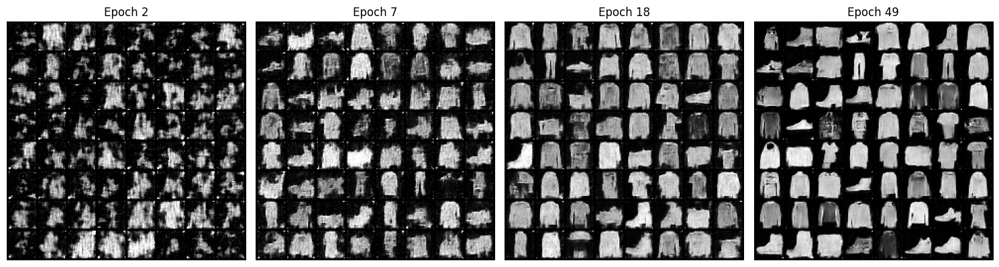

In [10]:
import matplotlib.pyplot as plt
from PIL import Image

# Specify the file paths of the four images
image_paths = [
    "ddpm_FashionMNIST2.png",
    "ddpm_FashionMNIST7.png",
    "ddpm_FashionMNIST18.png",
    "ddpm_FashionMNIST49.png",
]

# Create a figure with four subplots
fig, axs = plt.subplots(1, 4, figsize=(15, 5))

# Loop through each image path and display it in a subplot
for i, path in enumerate(image_paths):
    # Open the image using PIL
    img = Image.open(path)
    
    # Display the image in the corresponding subplot
    axs[i].imshow(img)
    axs[i].axis('off')
    

# Adjust layout to prevent overlapping
axs[0].set_title(f"Epoch 2")
axs[1].set_title(f"Epoch 7")
axs[2].set_title(f"Epoch 18")
axs[3].set_title(f"Epoch 49")
plt.tight_layout()
plt.show()


### Loss per Epoch for FashionMNIST

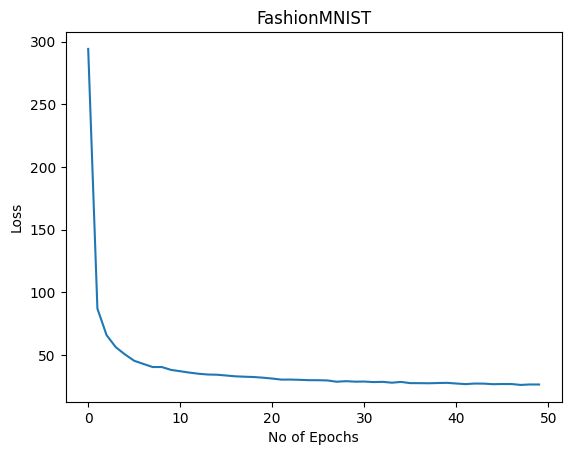

In [38]:
# Normalize the training loss by the number of training samples
loss_fashionmnist = np.array(loss_fashionmnist) / 57000

# Plot the normalized training loss
plt.plot(loss_fashionmnist)
plt.xlabel("No of Epochs")
plt.ylabel("Loss")
plt.title("FashionMNIST")
plt.show()

### U-Net Architecture for CIFAR10

In [47]:
class UNet_cifar(nn.Module):
    """A time-dependent score-based model built upon U-Net architecture."""

    def __init__(self, marginal_prob_std, channels=[32, 64, 128, 256], embed_dim=256,
               text_dim=256, nClass=10):

        """Args:
          marginal_prob_std: A function that takes time t and gives the standard
            deviation of the perturbation kernel p_{0t}(x(t) | x(0)).
          channels: The number of channels for feature maps of each resolution.
          embed_dim: The dimensionality of Gaussian random feature embeddings of time.
          text_dim:  the embedding dimension of text / digits.
          nClass:    number of classes you want to model.
        """
        super().__init__()
        # Gaussian random feature embedding layer for time
        self.time_embed = nn.Sequential(
            GaussianFourierProjection(embed_dim=embed_dim),
            nn.Linear(embed_dim, embed_dim)
            )
        # Encoding layers where the resolution decreases
        self.conv0 = nn.Conv2d(3, channels[0], 3, stride=1, bias=False, padding='same')
        self.dense0 = Dense(embed_dim, channels[0])
        self.gnorm0 = nn.GroupNorm(4, num_channels=channels[0])  # Input: 3 channels, Output: channels[0]

        self.conv1 = nn.Conv2d(channels[0], channels[0], 3, stride=1, bias=False, padding='same')
        self.dense1 = Dense(embed_dim, channels[0])
        self.gnorm1 = nn.GroupNorm(4, num_channels=channels[0])  # Input: channels[0], Output: channels[0]

        self.conv2 = nn.Conv2d(channels[0], channels[1], 2, stride=2, bias=False)  # Input: channels[0], Output: channels[1]
        self.dense2 = Dense(embed_dim, channels[1])
        self.gnorm2 = nn.GroupNorm(32, num_channels=channels[1])  # Input: channels[1], Output: channels[1]

        self.conv3 = nn.Conv2d(channels[1], channels[2], 3, stride=1, bias=False, padding='same')  # Input: channels[1], Output: channels[2]
        self.dense3 = Dense(embed_dim, channels[2])
        self.gnorm3 = nn.GroupNorm(32, num_channels=channels[2])  # Input: channels[2], Output: channels[2]

        self.conv4 = nn.Conv2d(channels[2], channels[3], 2, stride=2, bias=False)  # Input: channels[2], Output: channels[3]
        self.dense4 = Dense(embed_dim, channels[3])
        self.gnorm4 = nn.GroupNorm(32, num_channels=channels[3])  # Input: channels[3], Output: channels[3]

        self.conv5 = nn.Conv2d(channels[3], channels[3], 2, stride=2, bias=False)  # Input: channels[3], Output: channels[3]
        self.dense5 = Dense(embed_dim, channels[3])
        self.gnorm5 = nn.GroupNorm(32, num_channels=channels[3])  # Input: channels[3], Output: channels[3]

        # Decoding layers where the resolution increases
        self.tconv5 = nn.ConvTranspose2d(channels[3], channels[3], 2, stride=2, bias=False)  # Input: channels[3], Output: channels[3]
        self.tdense5 = Dense(embed_dim, channels[3])
        self.tgnorm5 = nn.GroupNorm(32, num_channels=channels[3])  # Input: channels[3], Output: channels[3]

        self.tconv4 = nn.ConvTranspose2d(channels[3], channels[2], 2, stride=2, bias=False)  # Input: channels[3], Output: channels[2]
        self.tdense4 = Dense(embed_dim, channels[2])
        self.tgnorm4 = nn.GroupNorm(32, num_channels=channels[2])  # Input: channels[2], Output: channels[2]

        self.tconv3 = nn.ConvTranspose2d(channels[2], channels[1], 1, stride=1, bias=False)  # Input: channels[2], Output: channels[1]
        self.tdense3 = Dense(embed_dim, channels[1])
        self.tgnorm3 = nn.GroupNorm(32, num_channels=channels[1])  # Input: channels[1], Output: channels[1]

        self.tconv2 = nn.ConvTranspose2d(channels[1], channels[0], 2, stride=2, bias=False)  # Input: channels[1], Output: channels[0]
        self.tdense2 = Dense(embed_dim, channels[0])
        self.tgnorm2 = nn.GroupNorm(32, num_channels=channels[0])  # Input: channels[0], Output: channels[0]

        self.tconv1 = nn.ConvTranspose2d(channels[0], channels[0], 1, stride=1)  # Input: channels[0], Output: channels[0]
        self.tdense1 = Dense(embed_dim, channels[0])
        self.tgnorm1 = nn.GroupNorm(32, num_channels=channels[0])  # Input: channels[0], Output: channels[0]
        self.tconv0 = nn.ConvTranspose2d(channels[0], 3, 1, stride=1)  # Input: channels[0], Output: 3

        # The swish activation function
        self.act = nn.SiLU()  # lambda x: x * torch.sigmoid(x)
        self.marginal_prob_std = marginal_prob_std

    def forward(self, x, t, y=None):
        # Obtain the Gaussian random feature embedding for t
        embed = self.act(self.time_embed(t))
        # Encoding path
        h0 = self.conv0(x) + self.dense0(embed)  # Input: 3 channels, Output: channels[0]
        h0 = self.act(self.gnorm0(h0))
        h1 = self.conv1(h0) + self.dense1(embed)  # Input: channels[0], Output: channels[0]
        h1 = self.act(self.gnorm1(h1))
        h2 = self.conv2(h1) + self.dense2(embed)  # Input: channels[0], Output: channels[1]
        h2 = self.act(self.gnorm2(h2))
        h3 = self.conv3(h2) + self.dense3(embed)  # Input: channels[1], Output: channels[2]
        h3 = self.act(self.gnorm3(h3))
        h4 = self.conv4(h3) + self.dense4(embed)  # Input: channels[2], Output: channels[3]
        h4 = self.act(self.gnorm4(h4))
        h5 = self.conv5(h4) + self.dense5(embed)  # Input: channels[3], Output: channels[3]
        h5 = self.act(self.gnorm5(h5))

        # Decoding path
        h = self.tconv5(h5) + self.tdense5(embed)  # Input: channels[3], Output: channels[3]
        h = self.act(self.tgnorm5(h))
        h = self.tconv4(h + h4) + self.tdense4(embed)  # Input: channels[3], Output: channels[2]
        ## Skip connection from the encoding path
        h = self.act(self.tgnorm4(h))
        h = self.tconv3(h + h3) + self.tdense3(embed)  # Input: channels[2], Output: channels[1]
        h = self.act(self.tgnorm3(h))
        h = self.tconv2(h + h2) + self.tdense2(embed)  # Input: channels[1], Output: channels[0]
        h = self.act(self.tgnorm2(h))
        h = self.tconv1(h + h1) + self.tdense2(embed)  # Input: channels[0], Output: channels[0]
        h = self.act(self.tgnorm1(h))
        h = self.tconv0(h + h0)  # Input: channels[0], Output: 3

        # Normalize output
        h = h / self.marginal_prob_std(t)[:, None, None, None]
        return h


### Sampler for generating images using model trained on CIFAR10 

In [48]:
# Euler Maruyama Sampler code for CIFAR
num_steps = 1000
def Euler_Maruyama_sampler_cifar(score_model,
              marginal_prob_std,
              diffusion_coeff,
              batch_size=64,
              x_shape=(3, 32, 32),
              num_steps=num_steps,
              device='cuda:0',
              eps=1e-3, y=None):
    
    # Initialize time and initial samples
    t = torch.ones(batch_size, device=device)
    init_x = torch.randn(batch_size, *x_shape, device=device) \
    * marginal_prob_std(t)[:, None, None, None]
    
    # Generate time steps
    time_steps = torch.linspace(1., eps, num_steps, device=device)
    step_size = time_steps[0] - time_steps[1]
    x = init_x
    
    # Perform Euler-Maruyama sampling
    with torch.no_grad():
        for time_step in tqdm(time_steps):
            batch_time_step = torch.ones(batch_size, device=device) * time_step
            g = diffusion_coeff(batch_time_step)
            mean_x = x + (g**2)[:, None, None, None] * score_model(x, batch_time_step, y=y) * step_size
            x = mean_x + torch.sqrt(step_size) * g[:, None, None, None] * torch.randn_like(x)
            
    return mean_x

### Traning loop for CIFAR10

In [ ]:
# Training on CIFAR10 dataset for unconditional denoising

from tqdm import tqdm
from torchvision.utils import save_image, make_grid
from torchvision import datasets, transforms
import matplotlib.pyplot as plt

# Initialize the model and move it to the specified device
score_model = torch.nn.DataParallel(UNet_cifar(marginal_prob_std=marginal_prob_std_fn))
score_model = score_model.to(device)

# Number of epochs
epochs = 100
# Size of a mini-batch
batch_size = 256
# Learning rate
lr = 5e-4

# Load CIFAR10 dataset
dataset = datasets.CIFAR10('.', train=True, transform=transforms.ToTensor(), download=True)
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=4)

# Initialize Adam optimizer for model parameters
optimizer = Adam(score_model.parameters())
tqdm_epoch = trange(epochs)

# List to store the training loss at each epoch
loss_cifar = []

for epoch in tqdm_epoch:
    avg_loss = 0.
    num_items = 0
    
    # Iterate through the dataloader for each mini-batch
    for x, y in tqdm(dataloader):
        x = x.to(device)
        # Calculate the unconditional denoising loss
        loss = loss_fn_uncond(score_model, x, marginal_prob_std_fn)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        avg_loss += loss.item() * x.shape[0]
        num_items += x.shape[0]
        
    # Printing the averaged training loss so far
    tqdm_epoch.set_description('Average Loss: {:5f}'.format(avg_loss / num_items))
    # Updating the checkpoint after each epoch of training
    torch.save(score_model.state_dict(), 'ckpt.pth')
    
    # Append the average loss for the current epoch to the list
    loss_cifar.append(avg_loss)
    
    ## Sample generation
    with torch.no_grad():
    
        sample_batch_size = 64 
        num_steps = 500 
        sampler = Euler_Maruyama_sampler_cifar
        
        # Generate samples using the specified sampler
        samples = sampler(score_model,
                  marginal_prob_std_fn,
                  diffusion_coeff_fn,
                  sample_batch_size,
                  num_steps=num_steps,
                  device=device,
                  y=None)
        
        # Sample visualization
        samples = samples.clamp(0.0, 1.0)
        %matplotlib inline
        sample_grid = make_grid(samples, nrow=int(np.sqrt(sample_batch_size)))
        save_image(sample_grid, f"./final/ddpm_CIFAR{epoch}.png")


Files already downloaded and verified


  0%|          | 0/50 [00:00<?, ?it/s]


  0%|                                                                                              | 0/196 [00:00<?, ?it/s]/tmp/ipykernel_70766/2309205034.py:11: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(t, device=device)

100%|████████████████████████████████████████████████████████████████████████████████████| 196/196 [00:03<00:00, 54.01it/s]

  0%|                                                                                              | 0/500 [00:00<?, ?it/s]/tmp/ipykernel_70766/2309205034.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(sigma**t, device=device)

100%|███████████████████████████████████████████████████████████████████

### Sample Images

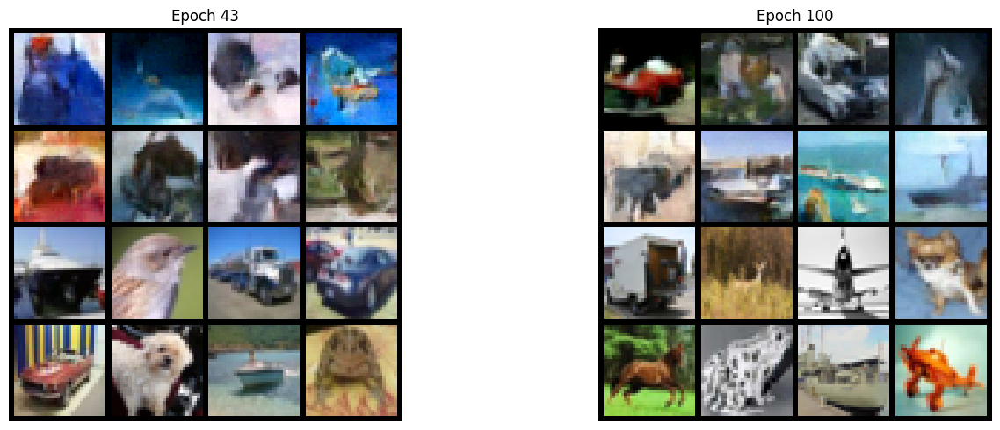

In [15]:
import matplotlib.pyplot as plt
from PIL import Image

# Specify the file paths of the four images
image_paths = [
    "_ddpm_sample_cifar43.png",
    "_ddpm_sample_cifar101.png",
]

# Create a figure with four subplots
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

# Loop through each image path and display it in a subplot
for i, path in enumerate(image_paths):
    # Open the image using PIL
    img = Image.open(path)
    
    # Display the image in the corresponding subplot
    axs[i].imshow(img)
    axs[i].axis('off')
    

# Adjust layout to prevent overlapping
axs[0].set_title(f"Epoch 43")
axs[1].set_title(f"Epoch 100")
plt.tight_layout()
plt.show()


### Loss per epoch for CIFAR10

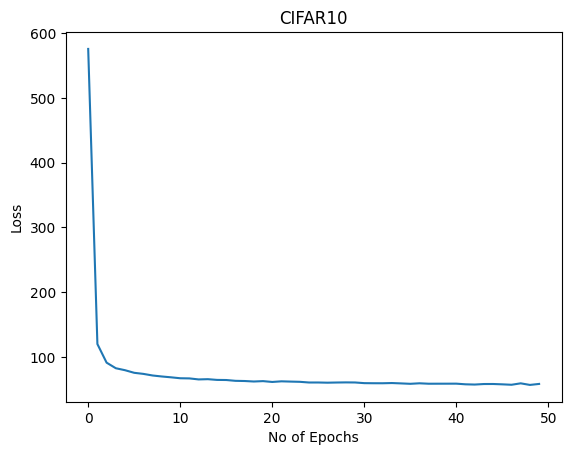

In [71]:
# Multiply the loss values by the size of the dataset (number of training samples) for proper scaling
loss_cifar = np.array(loss_cifar) * 50000

# Plot the training loss over epochs
plt.plot(loss_cifar)
plt.xlabel("Number of Epochs")
plt.ylabel("Loss")
plt.title("CIFAR10")
plt.show()

# Conditional Diffusion

### Word Embedding Layer

In [32]:
# Import necessary libraries
from einops import rearrange
import math

# Word Embeddings layers
class WordEmbed(nn.Module):
    
    def __init__(self, vocab_size, embed_dim):
        super(WordEmbed, self).__init__()
        
        # Initialize an embedding layer with vocabulary size and embedding dimension
        self.embed = nn.Embedding(vocab_size + 1, embed_dim)

    def forward(self, ids):
        # Forward pass through the embedding layer
        return self.embed(ids)

### CrossAttention Network for Conditional DDPM

In [28]:
class CrossAttention(nn.Module):
    
    def __init__(self, embed_dim, hidden_dim, context_dim=None, num_heads=1,):
        """
        Note: For simplicity reason, we just implemented 1-head attention.
        """
        super(CrossAttention, self).__init__()
        self.hidden_dim = hidden_dim
        self.context_dim = context_dim
        self.embed_dim = embed_dim
        
        # Linear layer for query
        self.query = nn.Linear(hidden_dim, embed_dim, bias=False)
        
        # Check if it's self-attention or cross-attention
        if context_dim is None:
            self.self_attn = True
            self.key = nn.Linear(hidden_dim, embed_dim, bias=False)     
            self.value = nn.Linear(hidden_dim, hidden_dim, bias=False) 
        else:
            self.self_attn = False
            self.key = nn.Linear(context_dim, embed_dim, bias=False)  
            self.value = nn.Linear(context_dim, hidden_dim, bias=False) 
            
    def forward(self, tokens, context=None):
        # tokens: with shape [batch, sequence_len, hidden_dim]
        # context: with shape [batch, contex_seq_len, context_dim]
        if self.self_attn:
            Q = self.query(tokens)
            K = self.key(tokens)
            V = self.value(tokens)
        else:
            # implement Q, K, V for the Cross attention
            Q = self.query(tokens)
            K = self.key(context)
            V = self.value(context)

        # Inner product of K and Q
        scoremats = torch.einsum('bsh, bth -> bst', K, Q)

        # Compute the attention distribution using softmax
        attnmats = torch.softmax(scoremats / (Q.shape[-1] ** 0.5), dim=-1)

        # Weighted average value vectors by attnmats
        ctx_vecs = torch.einsum("BTS,BSH->BTH", attnmats, V)
        return ctx_vecs
    
class TransformerBlock(nn.Module):
   
    """The transformer block that combines self-attn, cross-attn and feed forward neural net"""
    def __init__(self, hidden_dim, context_dim):
        super(TransformerBlock, self).__init__()
        
        # Self-attention layer
        self.attn_self = CrossAttention(hidden_dim, hidden_dim)
        
        # Cross-attention layer
        self.attn_cross = CrossAttention(hidden_dim, hidden_dim, context_dim)

        # Layer normalization
        self.norm1 = nn.LayerNorm(hidden_dim)
        self.norm2 = nn.LayerNorm(hidden_dim)
        self.norm3 = nn.LayerNorm(hidden_dim)
        
        # Feed-forward neural network
        hidden_units = 2 * hidden_dim
        self.ffn  = nn.Sequential(
            nn.Linear(hidden_dim, hidden_units),
            nn.GELU(),
            nn.Linear(hidden_units, hidden_dim)
        )

    def forward(self, x, context=None):
        # Notice the + x as residue connections
        x = self.attn_self(self.norm1(x)) + x
        # Notice the + x as residue connections
        x = self.attn_cross(self.norm2(x), context=context) + x
        # Notice the + x as residue connections
        x = self.ffn(self.norm3(x)) + x
        return x

class SpatialTransformer(nn.Module):
   
    def __init__(self, hidden_dim, context_dim):
        super(SpatialTransformer, self).__init__()
        
        # Transformer block
        self.transformer = TransformerBlock(hidden_dim, context_dim)

    def forward(self, x, context=None):
        b, c, h, w = x.shape
        x_in = x
        # Combine the spatial dimensions and move the channel dimen to the end
        x = rearrange(x, "b c h w->b (h w) c")
        # Apply the sequence transformer
        x = self.transformer(x, context)
        # Reverse the process
        x = rearrange(x, 'b (h w) c -> b c h w', h=h, w=w)
        # Residue
        return x + x_in

### U-net Architecture for MNIST and FashionMNIST

In [76]:
class UNet_Transformer_mnist(nn.Module):
    
    """A time-dependent score-based model built upon U-Net architecture."""

    def __init__(self, marginal_prob_std, channels=[32, 64, 128, 256], embed_dim=256,
               text_dim=256, nClass=10):

        """Args:
          marginal_prob_std: A function that takes time t and gives the standard
            deviation of the perturbation kernel p_{0t}(x(t) | x(0)).
          channels: The number of channels for feature maps of each resolution.
          embed_dim: The dimensionality of Gaussian random feature embeddings of time.
          text_dim:  the embedding dimension of text / digits.
          nClass:    number of classes you want to model.
        """
        super().__init__()
        # Gaussian random feature embedding layer for time
        self.time_embed = nn.Sequential(
            GaussianFourierProjection(embed_dim=embed_dim),
            nn.Linear(embed_dim, embed_dim)
            )
        
        # Encoding layers where the resolution decreases
        self.conv1 = nn.Conv2d(1, channels[0], 3, stride=1, bias=False)
        self.dense1 = Dense(embed_dim, channels[0])
        self.gnorm1 = nn.GroupNorm(4, num_channels=channels[0])

        self.conv2 = nn.Conv2d(channels[0], channels[1], 3, stride=2, bias=False)
        self.dense2 = Dense(embed_dim, channels[1])
        self.gnorm2 = nn.GroupNorm(32, num_channels=channels[1])

        self.conv3 = nn.Conv2d(channels[1], channels[2], 3, stride=2, bias=False)
        self.dense3 = Dense(embed_dim, channels[2])
        self.gnorm3 = nn.GroupNorm(32, num_channels=channels[2])
        self.attn3 = SpatialTransformer(channels[2], text_dim)

        self.conv4 = nn.Conv2d(channels[2], channels[3], 3, stride=2, bias=False)
        self.dense4 = Dense(embed_dim, channels[3])
        self.gnorm4 = nn.GroupNorm(32, num_channels=channels[3])
        self.attn4 = SpatialTransformer(channels[3], text_dim)

        # Decoding layers where the resolution increases
        self.tconv4 = nn.ConvTranspose2d(channels[3], channels[2], 3, stride=2, bias=False)
        self.dense5 = Dense(embed_dim, channels[2])
        self.tgnorm4 = nn.GroupNorm(32, num_channels=channels[2])

        self.tconv3 = nn.ConvTranspose2d(channels[2], channels[1], 3, stride=2, bias=False, output_padding=1)     #  + channels[2]
        self.dense6 = Dense(embed_dim, channels[1])
        self.tgnorm3 = nn.GroupNorm(32, num_channels=channels[1])

        self.tconv2 = nn.ConvTranspose2d(channels[1], channels[0], 3, stride=2, bias=False, output_padding=1)     #  + channels[1]
        self.dense7 = Dense(embed_dim, channels[0])
        self.tgnorm2 = nn.GroupNorm(32, num_channels=channels[0])
        self.tconv1 = nn.ConvTranspose2d(channels[0], 1, 3, stride=1) #  + channels[0]

        # The swish activation function
        self.act = nn.SiLU() # lambda x: x * torch.sigmoid(x)
        self.marginal_prob_std = marginal_prob_std
        self.cond_embed = nn.Embedding(nClass, text_dim)

    def forward(self, x, t, y=None):
        
        # Obtain the Gaussian random feature embedding for t
        embed = self.act(self.time_embed(t))
        y_embed = self.cond_embed(y).unsqueeze(1)
        
        # Encoding path
        h1 = self.conv1(x) + self.dense1(embed)
        h1 = self.act(self.gnorm1(h1))
        h2 = self.conv2(h1) + self.dense2(embed)
        h2 = self.act(self.gnorm2(h2))
        h3 = self.conv3(h2) + self.dense3(embed)
        h3 = self.act(self.gnorm3(h3))
        h3 = self.attn3(h3, y_embed)  # Use your attention layers
        h4 = self.conv4(h3) + self.dense4(embed)
        h4 = self.act(self.gnorm4(h4))
        h4 = self.attn4(h4, y_embed)

        # Decoding path
        h = self.tconv4(h4) + self.dense5(embed)
        h = self.act(self.tgnorm4(h))
        h = self.tconv3(h + h3) + self.dense6(embed)
        h = self.act(self.tgnorm3(h))
        h = self.tconv2(h + h2) + self.dense7(embed)
        h = self.act(self.tgnorm2(h))
        h = self.tconv1(h + h1)

        # Normalize output
        h = h / self.marginal_prob_std(t)[:, None, None, None]
        return h

### Loss function for Conditional DDPM

In [30]:
def loss_fn_cond(model, x, y, marginal_prob_std, eps=1e-5):

    """Args:
    model: A PyTorch model instance that represents a
      time-dependent score-based model.
    x: A mini-batch of training data.
    y: Labels for conditioning.
    marginal_prob_std: A function that gives the standard deviation of
      the perturbation kernel.
    eps: A tolerance value for numerical stability.
    """
    # Generate random time steps between (eps, 1-eps)
    random_t = torch.rand(x.shape[0], device=x.device) * (1. - eps) + eps
    # Generate random noise
    z = torch.randn_like(x)
    # Compute the standard deviation of the perturbation kernel
    std = marginal_prob_std(random_t)
    # Perturb the input data
    perturbed_x = x + z * std[:, None, None, None]
    # Model evaluation on perturbed data
    score = model(perturbed_x, random_t, y=y)
    # Compute the loss using the score and perturbation information
    loss = torch.mean(torch.sum((score * std[:, None, None, None] + z)**2, dim=(1,2,3)))
    return loss

### Training loop for MNIST

In [78]:
score_model = torch.nn.DataParallel(UNet_Transformer_mnist(marginal_prob_std=marginal_prob_std_fn))
score_model = score_model.to(device)

# Number of epochs
n_epochs = 100
# Size of a mini-batch
batch_size = 1024
# Learning rate
lr = 10e-4

# MNIST dataset loading
dataset = MNIST('.', train=True, transform=transforms.ToTensor(), download=True)
data_loader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=4)

# List to store conditional loss for each epoch
cond_loss_mnist = []

# Adam optimizer with a learning rate scheduler
optimizer = Adam(score_model.parameters(), lr=lr)
scheduler = LambdaLR(optimizer, lr_lambda=lambda epoch: max(0.2, 0.98 ** epoch))

# tqdm for epoch visualization
tqdm_epoch = trange(n_epochs)

# Training loop
for epoch in tqdm_epoch:
    avg_loss = 0.
    num_items = 0
    
    # Iterate over the mini-batches
    for x, y in tqdm(data_loader):
        x = x.to(device)
        # Compute conditional loss
        loss = loss_fn_cond(score_model, x, y, marginal_prob_std_fn)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        avg_loss += loss.item() * x.shape[0]
        num_items += x.shape[0]
    
    # Learning rate scheduling
    scheduler.step()
    
    # Append the averaged conditional loss for the epoch
    cond_loss_mnist.append(avg_loss / num_items)
    lr_current = scheduler.get_last_lr()[0]
    
    # Print epoch summary
    print('{} Average Loss: {:5f} lr {:.1e}'.format(epoch, avg_loss / num_items, lr_current))
    
    # Update the tqdm visualization
    tqdm_epoch.set_description('Average Loss: {:5f}'.format(avg_loss / num_items))
    
    # Save the model checkpoint after each epoch
    torch.save(score_model.state_dict(), 'ckpt_transformer.pth')

  0%|          | 0/100 [00:00<?, ?it/s]


  0%|                                                    | 0/59 [00:00<?, ?it/s]/tmp/ipykernel_70766/2309205034.py:11: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(t, device=device)

100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 37.49it/s]


0 Average Loss: 730.674935 lr 9.8e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 37.59it/s]


1 Average Loss: 217.229613 lr 9.6e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 38.27it/s]


2 Average Loss: 146.004434 lr 9.4e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 36.41it/s]


3 Average Loss: 112.738229 lr 9.2e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 33.63it/s]


4 Average Loss: 93.108172 lr 9.0e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 36.07it/s]


5 Average Loss: 81.029582 lr 8.9e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 36.96it/s]


6 Average Loss: 72.016759 lr 8.7e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 36.23it/s]


7 Average Loss: 66.077873 lr 8.5e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 37.04it/s]


8 Average Loss: 60.874041 lr 8.3e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 36.52it/s]


9 Average Loss: 56.640714 lr 8.2e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 36.58it/s]


10 Average Loss: 53.837973 lr 8.0e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 37.36it/s]


11 Average Loss: 51.128697 lr 7.8e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 37.02it/s]


12 Average Loss: 48.612331 lr 7.7e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 35.74it/s]


13 Average Loss: 46.655267 lr 7.5e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 36.19it/s]


14 Average Loss: 44.928615 lr 7.4e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 36.35it/s]


15 Average Loss: 43.210928 lr 7.2e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 36.29it/s]


16 Average Loss: 41.578524 lr 7.1e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 37.85it/s]


17 Average Loss: 40.588840 lr 7.0e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 36.92it/s]


18 Average Loss: 39.003257 lr 6.8e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 33.20it/s]


19 Average Loss: 38.033126 lr 6.7e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 36.98it/s]


20 Average Loss: 37.099458 lr 6.5e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 37.66it/s]


21 Average Loss: 36.085807 lr 6.4e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 37.79it/s]


22 Average Loss: 35.535280 lr 6.3e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 32.99it/s]


23 Average Loss: 34.410264 lr 6.2e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 36.76it/s]


24 Average Loss: 33.477505 lr 6.0e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 36.76it/s]


25 Average Loss: 33.164415 lr 5.9e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 36.04it/s]


26 Average Loss: 32.531278 lr 5.8e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 37.39it/s]


27 Average Loss: 31.811202 lr 5.7e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 37.32it/s]


28 Average Loss: 31.571659 lr 5.6e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 36.02it/s]


29 Average Loss: 31.076134 lr 5.5e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 37.23it/s]


30 Average Loss: 30.482979 lr 5.3e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 38.15it/s]


31 Average Loss: 29.931586 lr 5.2e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 37.10it/s]


32 Average Loss: 29.719604 lr 5.1e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 37.16it/s]


33 Average Loss: 28.962505 lr 5.0e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 36.98it/s]


34 Average Loss: 28.721734 lr 4.9e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 37.44it/s]


35 Average Loss: 28.582025 lr 4.8e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 36.64it/s]


36 Average Loss: 28.216014 lr 4.7e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 35.57it/s]


37 Average Loss: 28.037180 lr 4.6e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 36.96it/s]


38 Average Loss: 27.496572 lr 4.5e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 35.71it/s]


39 Average Loss: 27.347173 lr 4.5e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 36.12it/s]


40 Average Loss: 26.968473 lr 4.4e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 36.35it/s]


41 Average Loss: 26.746034 lr 4.3e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 37.14it/s]


42 Average Loss: 26.504371 lr 4.2e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 37.25it/s]


43 Average Loss: 26.453615 lr 4.1e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 36.50it/s]


44 Average Loss: 26.043770 lr 4.0e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 36.98it/s]


45 Average Loss: 25.950173 lr 3.9e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 34.59it/s]


46 Average Loss: 25.739635 lr 3.9e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 35.51it/s]


47 Average Loss: 25.746214 lr 3.8e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 36.21it/s]


48 Average Loss: 25.336512 lr 3.7e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 35.99it/s]


49 Average Loss: 24.857574 lr 3.6e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 36.35it/s]


50 Average Loss: 24.970965 lr 3.6e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 35.69it/s]


51 Average Loss: 24.677916 lr 3.5e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 36.28it/s]


52 Average Loss: 24.637545 lr 3.4e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 37.57it/s]


53 Average Loss: 24.678111 lr 3.4e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 38.36it/s]


54 Average Loss: 24.244214 lr 3.3e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 38.54it/s]


55 Average Loss: 24.252936 lr 3.2e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 37.76it/s]


56 Average Loss: 24.226930 lr 3.2e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 36.49it/s]


57 Average Loss: 23.948443 lr 3.1e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 36.70it/s]


58 Average Loss: 23.905353 lr 3.0e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 34.96it/s]


59 Average Loss: 23.789369 lr 3.0e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 36.84it/s]


60 Average Loss: 23.883366 lr 2.9e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 35.01it/s]


61 Average Loss: 23.644731 lr 2.9e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 34.39it/s]


62 Average Loss: 23.468031 lr 2.8e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 33.76it/s]


63 Average Loss: 23.425298 lr 2.7e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 35.90it/s]


64 Average Loss: 23.150602 lr 2.7e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 36.04it/s]


65 Average Loss: 23.262161 lr 2.6e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 35.72it/s]


66 Average Loss: 23.049630 lr 2.6e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 37.13it/s]


67 Average Loss: 23.070383 lr 2.5e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 35.44it/s]


68 Average Loss: 22.955027 lr 2.5e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 35.48it/s]


69 Average Loss: 22.895210 lr 2.4e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 36.63it/s]


70 Average Loss: 22.651135 lr 2.4e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 36.51it/s]


71 Average Loss: 22.468153 lr 2.3e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 37.40it/s]


72 Average Loss: 22.517283 lr 2.3e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 32.26it/s]


73 Average Loss: 22.433378 lr 2.2e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 37.71it/s]


74 Average Loss: 22.369458 lr 2.2e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 33.61it/s]


75 Average Loss: 22.336833 lr 2.2e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 38.83it/s]


76 Average Loss: 22.243150 lr 2.1e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 36.36it/s]


77 Average Loss: 22.143439 lr 2.1e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 38.29it/s]


78 Average Loss: 22.153815 lr 2.0e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 38.38it/s]


79 Average Loss: 22.122525 lr 2.0e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 37.00it/s]


80 Average Loss: 22.065710 lr 2.0e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 37.73it/s]


81 Average Loss: 21.820615 lr 2.0e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 35.84it/s]


82 Average Loss: 21.840406 lr 2.0e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 36.54it/s]


83 Average Loss: 22.139123 lr 2.0e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 37.76it/s]


84 Average Loss: 21.666740 lr 2.0e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 37.46it/s]


85 Average Loss: 21.599457 lr 2.0e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 37.63it/s]


86 Average Loss: 21.870318 lr 2.0e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 37.88it/s]


87 Average Loss: 21.679278 lr 2.0e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 37.75it/s]


88 Average Loss: 21.566481 lr 2.0e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 37.95it/s]


89 Average Loss: 21.565625 lr 2.0e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 37.84it/s]


90 Average Loss: 21.600809 lr 2.0e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 38.52it/s]


91 Average Loss: 21.522394 lr 2.0e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 37.50it/s]


92 Average Loss: 21.347020 lr 2.0e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 37.47it/s]


93 Average Loss: 21.271032 lr 2.0e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 36.48it/s]


94 Average Loss: 21.233357 lr 2.0e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 38.46it/s]


95 Average Loss: 21.093984 lr 2.0e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 37.46it/s]


96 Average Loss: 21.248259 lr 2.0e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 37.32it/s]


97 Average Loss: 21.142446 lr 2.0e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 37.82it/s]


98 Average Loss: 20.981638 lr 2.0e-04



100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 36.75it/s]

99 Average Loss: 21.055532 lr 2.0e-04


### Loss per epoch for MNIST

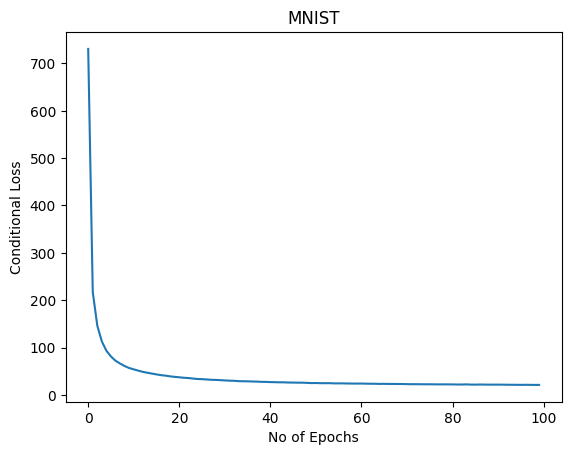

In [79]:
cond_loss_mnist = np.array(cond_loss_mnist)
plt.plot(cond_loss_mnist)
plt.xlabel("No of Epochs")
plt.ylabel("Conditional Loss")
plt.title("MNIST")
plt.show()

### Sampler code for generation of Conditional MNIST Images

/tmp/ipykernel_70766/2309205034.py:11: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(t, device=device)
  0%|                                                   | 0/500 [00:00<?, ?it/s]/tmp/ipykernel_70766/2309205034.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(sigma**t, device=device)
100%|████████████████████████████████████████| 500/500 [00:01<00:00, 267.45it/s]


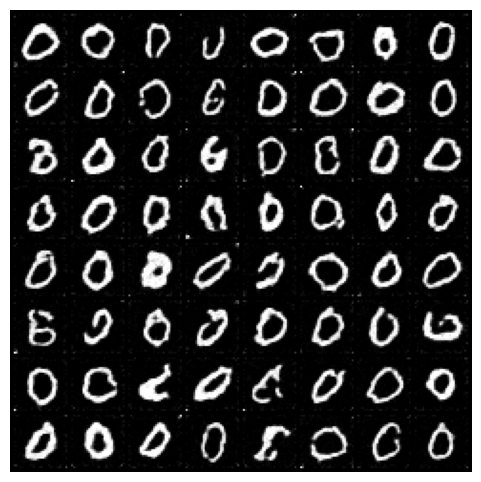

100%|████████████████████████████████████████| 500/500 [00:01<00:00, 268.45it/s]


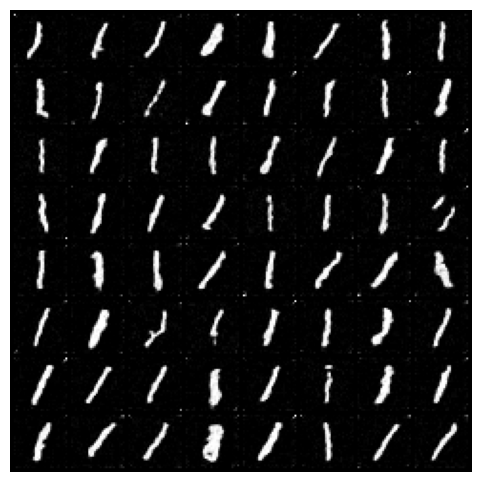

100%|████████████████████████████████████████| 500/500 [00:01<00:00, 268.66it/s]


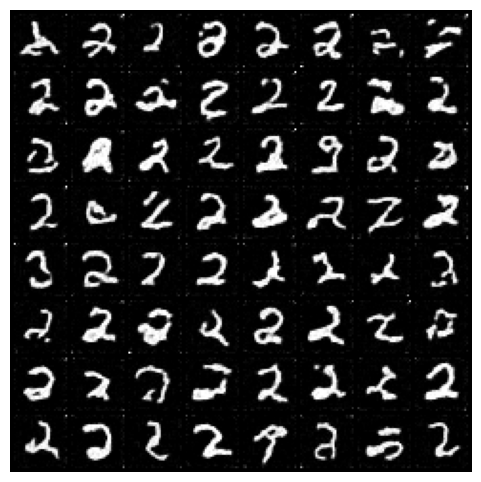

100%|████████████████████████████████████████| 500/500 [00:01<00:00, 268.52it/s]


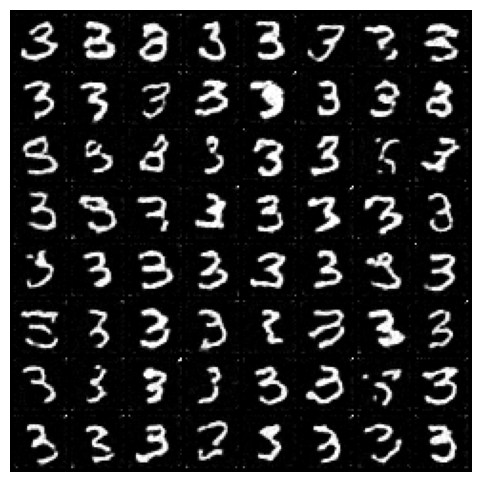

100%|████████████████████████████████████████| 500/500 [00:01<00:00, 268.97it/s]


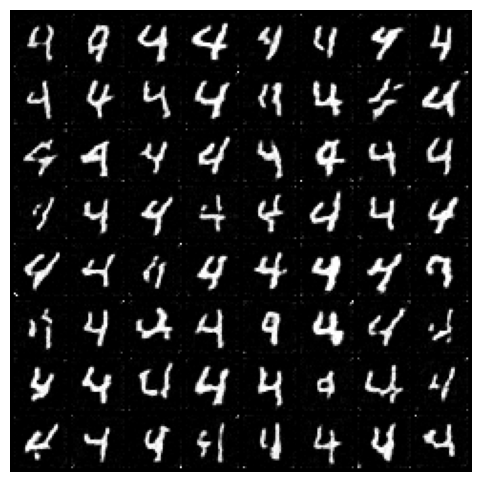

100%|████████████████████████████████████████| 500/500 [00:01<00:00, 269.31it/s]


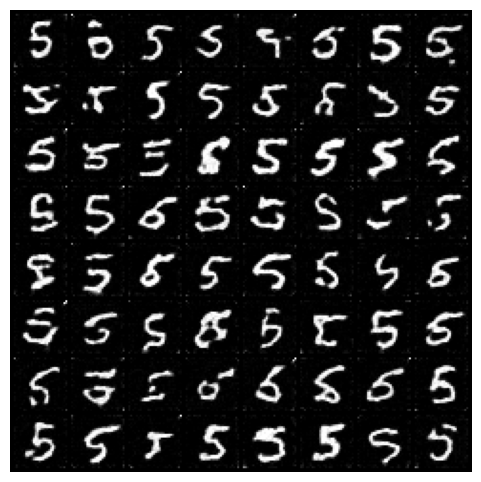

100%|████████████████████████████████████████| 500/500 [00:01<00:00, 269.35it/s]


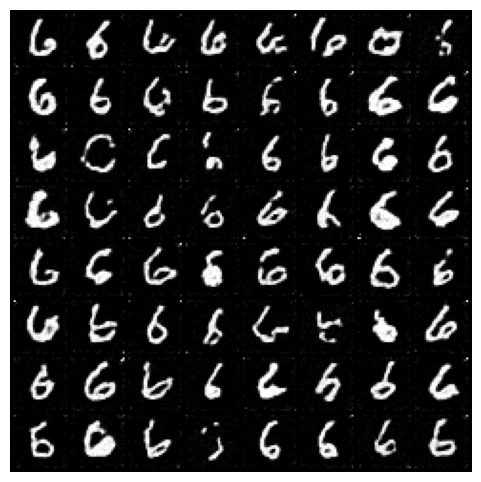

100%|████████████████████████████████████████| 500/500 [00:01<00:00, 269.51it/s]


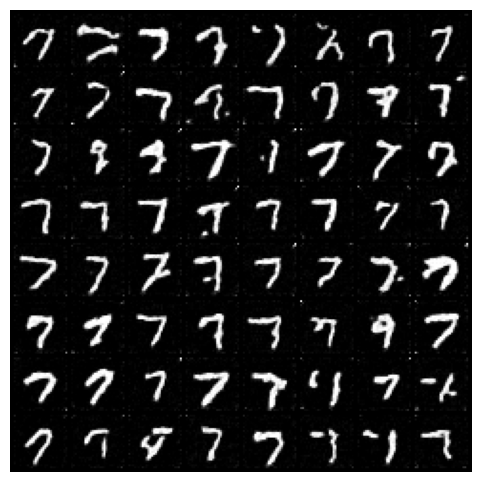

100%|████████████████████████████████████████| 500/500 [00:01<00:00, 260.36it/s]


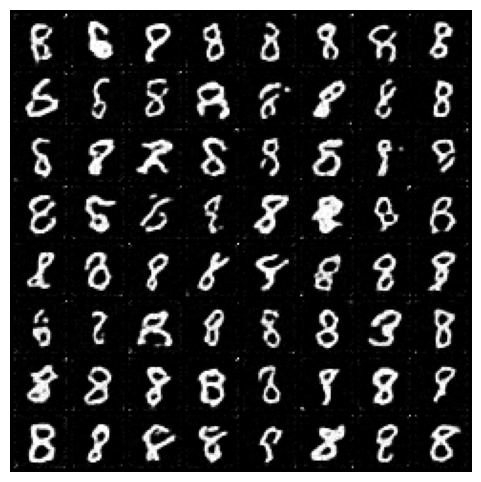

100%|████████████████████████████████████████| 500/500 [00:02<00:00, 244.35it/s]


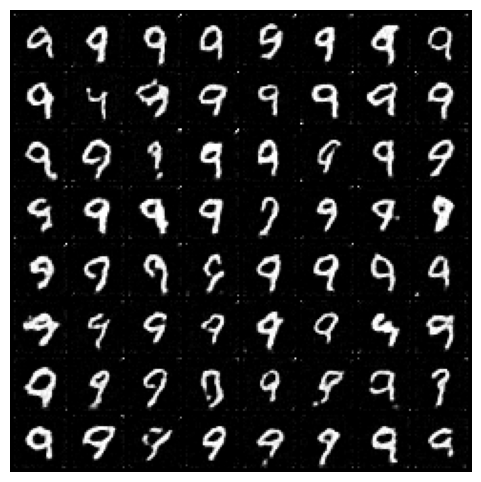

In [81]:
# Import necessary functions from torchvision
from torchvision.utils import save_image, make_grid

# Load the pre-trained checkpoint from disk.
device = 'cuda:0'

# Iterate over each digit (0 to 9)
for digit in range(0, 10):
    # Set the sample batch size and number of steps for the sampler
    sample_batch_size = 64
    num_steps = 500
    sampler = Euler_Maruyama_sampler_mnist

    # Generate samples using the specified sampler with the given digit label
    samples = sampler(score_model,
                      marginal_prob_std_fn,
                      diffusion_coeff_fn,
                      sample_batch_size,
                      num_steps=num_steps,
                      device=device,
                      y=digit * torch.ones(sample_batch_size, dtype=torch.long))

    # Clamp generated samples between 0.0 and 1.0
    samples = samples.clamp(0.0, 1.0)

    # Visualize the generated samples using matplotlib
    %matplotlib inline
    import matplotlib.pyplot as plt
    sample_grid = make_grid(samples, nrow=int(np.sqrt(sample_batch_size)))

    # Plot the sample grid
    plt.figure(figsize=(6, 6))
    plt.axis('off')
    plt.imshow(sample_grid.permute(1, 2, 0).cpu(), vmin=0., vmax=1.)
    plt.show()

    # Save the sample grid as an image file
    save_image(sample_grid, f"./final/conditional_mnist_{digit}.png")

### Training loop for FashionMNIST

In [86]:
# Import necessary modules from torchvision
from torchvision import datasets

# Initialize a DataParallel UNet_Transformer_mnist model with the specified marginal probability function
score_model = torch.nn.DataParallel(UNet_Transformer_mnist(marginal_prob_std=marginal_prob_std_fn))
# Move the model to the specified device (cuda:0)
score_model = score_model.to(device)

# Set the number of training epochs
n_epochs = 60
# Set the size of a mini-batch
batch_size = 256
# Set the learning rate
lr = 10e-4

# Load the FashionMNIST dataset with specified transformations
dataset = datasets.FashionMNIST('.', train=True, transform=transforms.ToTensor(), download=True)
# Create a DataLoader for the dataset
data_loader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=4)
# Initialize an empty list to store conditional losses during training
cond_loss_fashion = []

# Initialize an Adam optimizer for the model parameters with the specified learning rate
optimizer = Adam(score_model.parameters(), lr=lr)
# Initialize a learning rate scheduler using LambdaLR
scheduler = LambdaLR(optimizer, lr_lambda=lambda epoch: max(0.2, 0.98 ** epoch))
# Initialize a tqdm progress bar for the epochs
tqdm_epoch = trange(n_epochs)

# Training loop
for epoch in tqdm_epoch:
    avg_loss = 0.
    num_items = 0
    
    # Iterate over batches in the data loader
    for x, y in tqdm(data_loader):
        # Move input data to the specified device
        x = x.to(device)
        # Calculate conditional loss
        loss = loss_fn_cond(score_model, x, y, marginal_prob_std_fn)
        # Zero the gradients
        optimizer.zero_grad()
        # Backward pass
        loss.backward()
        # Update model parameters
        optimizer.step()
        # Accumulate loss and item count
        avg_loss += loss.item() * x.shape[0]
        num_items += x.shape[0]
    
    # Update the learning rate using the scheduler
    scheduler.step()
    # Store the average conditional loss for the epoch
    cond_loss_fashion.append(avg_loss / num_items)
    # Get the current learning rate
    lr_current = scheduler.get_last_lr()[0]
    # Print epoch, average loss, and current learning rate
    print('{} Average Loss: {:5f} lr {:.1e}'.format(epoch, avg_loss / num_items, lr_current))
    # Update the tqdm description with the averaged training loss
    tqdm_epoch.set_description('Average Loss: {:5f}'.format(avg_loss / num_items))
    # Save the model checkpoint after each epoch of training
    torch.save(score_model.state_dict(), 'ckpt_transformer.pth')

  0%|          | 0/60 [00:00<?, ?it/s]


  0%|                                                   | 0/235 [00:00<?, ?it/s]/tmp/ipykernel_70766/2309205034.py:11: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(t, device=device)

100%|█████████████████████████████████████████| 235/235 [00:04<00:00, 51.69it/s]


0 Average Loss: 340.225476 lr 9.8e-04



100%|█████████████████████████████████████████| 235/235 [00:04<00:00, 50.42it/s]


1 Average Loss: 83.867049 lr 9.6e-04



100%|█████████████████████████████████████████| 235/235 [00:04<00:00, 47.92it/s]


2 Average Loss: 59.426222 lr 9.4e-04



100%|█████████████████████████████████████████| 235/235 [00:04<00:00, 50.70it/s]


3 Average Loss: 50.124783 lr 9.2e-04



100%|█████████████████████████████████████████| 235/235 [00:04<00:00, 50.52it/s]


4 Average Loss: 45.448736 lr 9.0e-04



100%|█████████████████████████████████████████| 235/235 [00:04<00:00, 50.71it/s]


5 Average Loss: 42.866193 lr 8.9e-04



100%|█████████████████████████████████████████| 235/235 [00:04<00:00, 50.27it/s]


6 Average Loss: 40.190426 lr 8.7e-04



100%|█████████████████████████████████████████| 235/235 [00:04<00:00, 51.11it/s]


7 Average Loss: 38.556613 lr 8.5e-04



100%|█████████████████████████████████████████| 235/235 [00:04<00:00, 48.60it/s]


8 Average Loss: 37.473835 lr 8.3e-04



100%|█████████████████████████████████████████| 235/235 [00:04<00:00, 52.24it/s]


9 Average Loss: 36.001021 lr 8.2e-04



100%|█████████████████████████████████████████| 235/235 [00:04<00:00, 49.46it/s]


10 Average Loss: 35.299444 lr 8.0e-04



100%|█████████████████████████████████████████| 235/235 [00:04<00:00, 49.43it/s]


11 Average Loss: 34.352050 lr 7.8e-04



100%|█████████████████████████████████████████| 235/235 [00:04<00:00, 49.80it/s]


12 Average Loss: 33.549189 lr 7.7e-04



100%|█████████████████████████████████████████| 235/235 [00:04<00:00, 50.13it/s]


13 Average Loss: 33.070793 lr 7.5e-04



100%|█████████████████████████████████████████| 235/235 [00:04<00:00, 50.78it/s]


14 Average Loss: 31.975743 lr 7.4e-04



100%|█████████████████████████████████████████| 235/235 [00:04<00:00, 49.26it/s]


15 Average Loss: 31.307296 lr 7.2e-04



100%|█████████████████████████████████████████| 235/235 [00:04<00:00, 48.32it/s]


16 Average Loss: 30.969590 lr 7.1e-04



100%|█████████████████████████████████████████| 235/235 [00:04<00:00, 48.23it/s]


17 Average Loss: 30.714148 lr 7.0e-04



100%|█████████████████████████████████████████| 235/235 [00:04<00:00, 49.68it/s]


18 Average Loss: 30.257533 lr 6.8e-04



100%|█████████████████████████████████████████| 235/235 [00:04<00:00, 47.38it/s]


19 Average Loss: 29.886502 lr 6.7e-04



100%|█████████████████████████████████████████| 235/235 [00:04<00:00, 51.39it/s]


20 Average Loss: 29.682166 lr 6.5e-04



100%|█████████████████████████████████████████| 235/235 [00:04<00:00, 50.86it/s]


21 Average Loss: 29.346579 lr 6.4e-04



100%|█████████████████████████████████████████| 235/235 [00:04<00:00, 51.33it/s]


22 Average Loss: 28.702100 lr 6.3e-04



100%|█████████████████████████████████████████| 235/235 [00:04<00:00, 51.14it/s]


23 Average Loss: 28.212099 lr 6.2e-04



100%|█████████████████████████████████████████| 235/235 [00:04<00:00, 50.77it/s]


24 Average Loss: 28.111771 lr 6.0e-04



100%|█████████████████████████████████████████| 235/235 [00:04<00:00, 49.58it/s]


25 Average Loss: 27.783872 lr 5.9e-04



100%|█████████████████████████████████████████| 235/235 [00:04<00:00, 51.02it/s]


26 Average Loss: 27.449875 lr 5.8e-04



100%|█████████████████████████████████████████| 235/235 [00:04<00:00, 51.80it/s]


27 Average Loss: 26.989410 lr 5.7e-04



100%|█████████████████████████████████████████| 235/235 [00:04<00:00, 50.05it/s]


28 Average Loss: 26.924930 lr 5.6e-04



100%|█████████████████████████████████████████| 235/235 [00:04<00:00, 51.40it/s]


29 Average Loss: 26.796247 lr 5.5e-04



100%|█████████████████████████████████████████| 235/235 [00:04<00:00, 50.45it/s]


30 Average Loss: 26.315933 lr 5.3e-04



100%|█████████████████████████████████████████| 235/235 [00:04<00:00, 48.24it/s]


31 Average Loss: 26.189058 lr 5.2e-04



100%|█████████████████████████████████████████| 235/235 [00:04<00:00, 51.61it/s]


32 Average Loss: 26.438915 lr 5.1e-04



100%|█████████████████████████████████████████| 235/235 [00:04<00:00, 51.68it/s]


33 Average Loss: 26.276707 lr 5.0e-04



100%|█████████████████████████████████████████| 235/235 [00:04<00:00, 51.13it/s]


34 Average Loss: 25.828009 lr 4.9e-04



100%|█████████████████████████████████████████| 235/235 [00:04<00:00, 50.06it/s]


35 Average Loss: 25.792907 lr 4.8e-04



100%|█████████████████████████████████████████| 235/235 [00:04<00:00, 50.76it/s]


36 Average Loss: 25.440221 lr 4.7e-04



100%|█████████████████████████████████████████| 235/235 [00:04<00:00, 51.43it/s]


37 Average Loss: 25.011519 lr 4.6e-04



100%|█████████████████████████████████████████| 235/235 [00:04<00:00, 51.27it/s]


38 Average Loss: 25.419239 lr 4.5e-04



100%|█████████████████████████████████████████| 235/235 [00:04<00:00, 50.67it/s]


39 Average Loss: 25.223928 lr 4.5e-04



100%|█████████████████████████████████████████| 235/235 [00:04<00:00, 51.25it/s]


40 Average Loss: 25.158155 lr 4.4e-04



100%|█████████████████████████████████████████| 235/235 [00:04<00:00, 52.56it/s]


41 Average Loss: 25.016322 lr 4.3e-04



100%|█████████████████████████████████████████| 235/235 [00:04<00:00, 50.50it/s]


42 Average Loss: 24.790893 lr 4.2e-04



100%|█████████████████████████████████████████| 235/235 [00:04<00:00, 51.68it/s]


43 Average Loss: 24.647111 lr 4.1e-04



100%|█████████████████████████████████████████| 235/235 [00:04<00:00, 51.30it/s]


44 Average Loss: 24.541551 lr 4.0e-04



100%|█████████████████████████████████████████| 235/235 [00:04<00:00, 51.98it/s]


45 Average Loss: 24.733165 lr 3.9e-04



100%|█████████████████████████████████████████| 235/235 [00:04<00:00, 51.11it/s]


46 Average Loss: 24.633860 lr 3.9e-04



100%|█████████████████████████████████████████| 235/235 [00:04<00:00, 49.96it/s]


47 Average Loss: 24.059136 lr 3.8e-04



100%|█████████████████████████████████████████| 235/235 [00:04<00:00, 51.35it/s]


48 Average Loss: 24.157827 lr 3.7e-04



100%|█████████████████████████████████████████| 235/235 [00:04<00:00, 51.92it/s]


49 Average Loss: 24.462364 lr 3.6e-04



100%|█████████████████████████████████████████| 235/235 [00:04<00:00, 51.09it/s]


50 Average Loss: 23.870912 lr 3.6e-04



100%|█████████████████████████████████████████| 235/235 [00:04<00:00, 48.65it/s]


51 Average Loss: 24.137460 lr 3.5e-04



100%|█████████████████████████████████████████| 235/235 [00:04<00:00, 51.06it/s]


52 Average Loss: 23.888821 lr 3.4e-04



100%|█████████████████████████████████████████| 235/235 [00:04<00:00, 49.74it/s]


53 Average Loss: 24.034124 lr 3.4e-04



100%|█████████████████████████████████████████| 235/235 [00:04<00:00, 51.24it/s]


54 Average Loss: 23.726614 lr 3.3e-04



100%|█████████████████████████████████████████| 235/235 [00:04<00:00, 52.06it/s]


55 Average Loss: 23.499370 lr 3.2e-04



100%|█████████████████████████████████████████| 235/235 [00:04<00:00, 51.31it/s]


56 Average Loss: 23.642092 lr 3.2e-04



100%|█████████████████████████████████████████| 235/235 [00:04<00:00, 50.32it/s]


57 Average Loss: 23.666229 lr 3.1e-04



100%|█████████████████████████████████████████| 235/235 [00:04<00:00, 50.96it/s]


58 Average Loss: 23.346949 lr 3.0e-04



100%|█████████████████████████████████████████| 235/235 [00:04<00:00, 50.26it/s]

59 Average Loss: 23.808449 lr 3.0e-04


### Loss per epoch for FashionMNIST

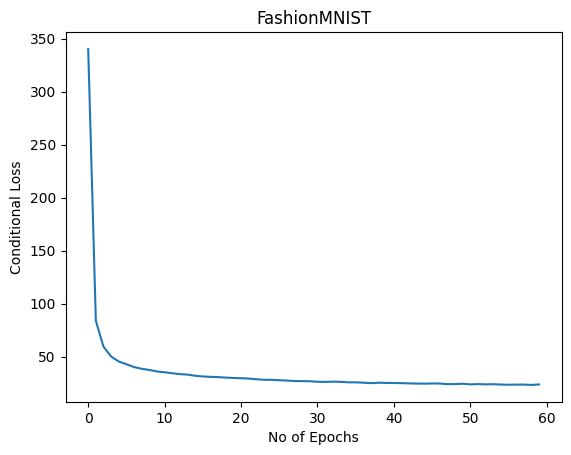

In [87]:
cond_loss_fashion = np.array(cond_loss_fashion)
plt.plot(cond_loss_fashion)
plt.xlabel("No of Epochs")
plt.ylabel("Conditional Loss")
plt.title("FashionMNIST")
plt.show()

### Sample code for Generation of Conditional FashionMNIST

/tmp/ipykernel_70766/2309205034.py:11: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(t, device=device)
  0%|                                                   | 0/500 [00:00<?, ?it/s]/tmp/ipykernel_70766/2309205034.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(sigma**t, device=device)
100%|████████████████████████████████████████| 500/500 [00:01<00:00, 266.53it/s]


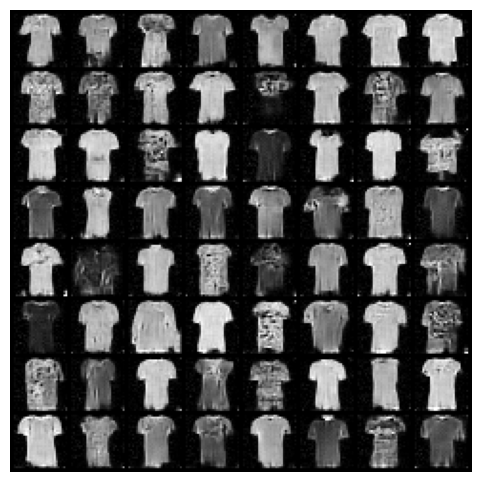

100%|████████████████████████████████████████| 500/500 [00:01<00:00, 267.83it/s]


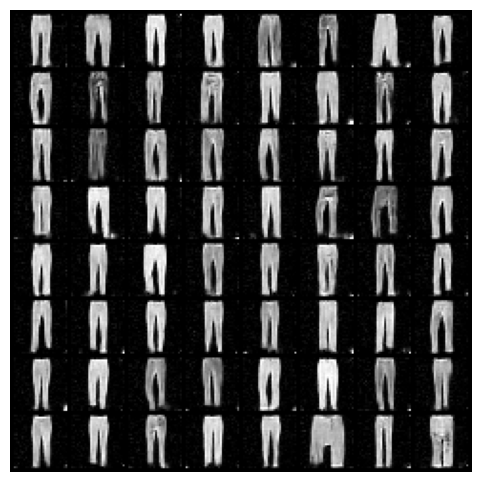

100%|████████████████████████████████████████| 500/500 [00:01<00:00, 267.93it/s]


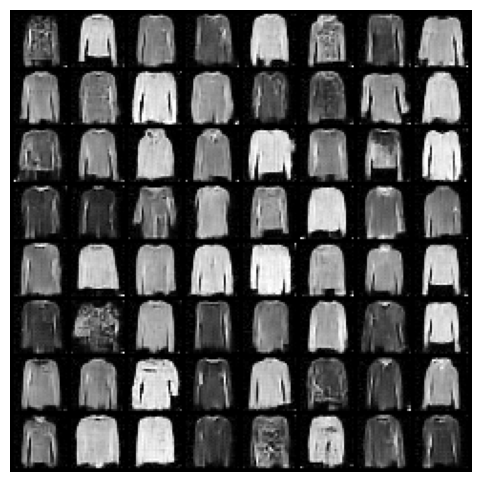

100%|████████████████████████████████████████| 500/500 [00:01<00:00, 269.02it/s]


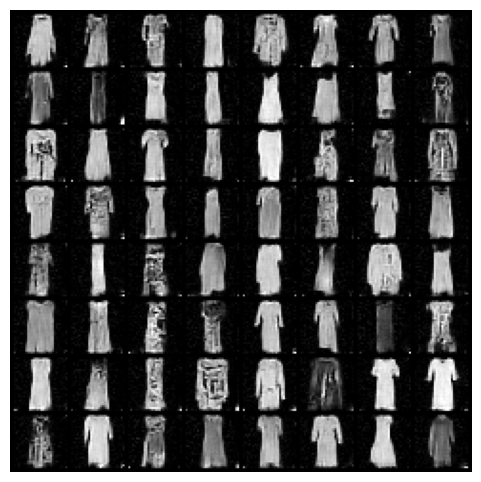

100%|████████████████████████████████████████| 500/500 [00:01<00:00, 268.93it/s]


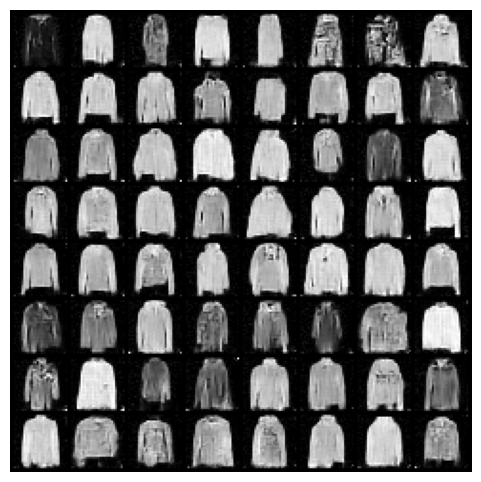

100%|████████████████████████████████████████| 500/500 [00:01<00:00, 268.17it/s]


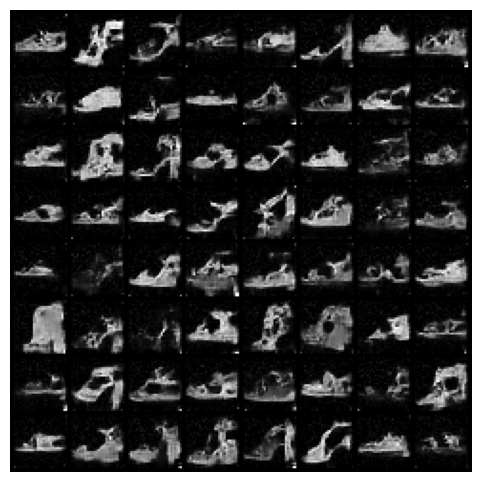

100%|████████████████████████████████████████| 500/500 [00:01<00:00, 271.00it/s]


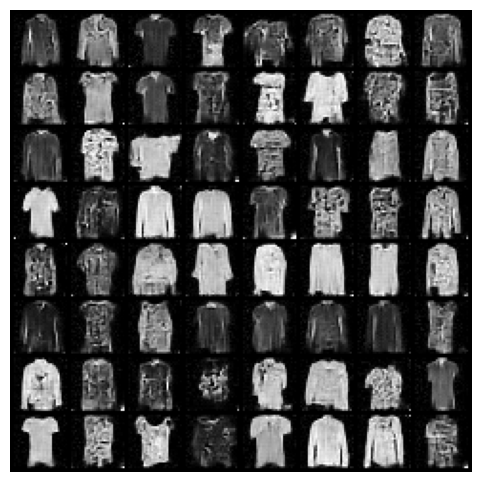

100%|████████████████████████████████████████| 500/500 [00:01<00:00, 270.36it/s]


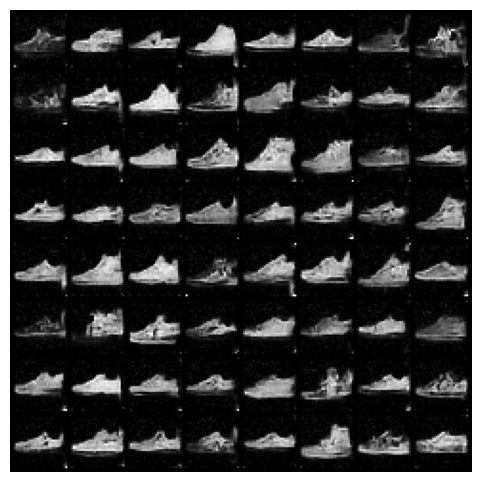

100%|████████████████████████████████████████| 500/500 [00:01<00:00, 268.63it/s]


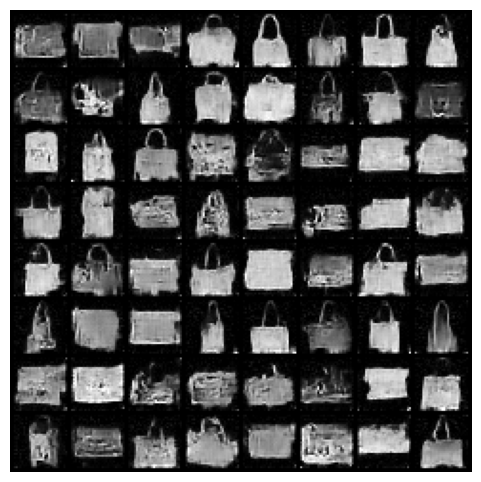

100%|████████████████████████████████████████| 500/500 [00:01<00:00, 266.88it/s]


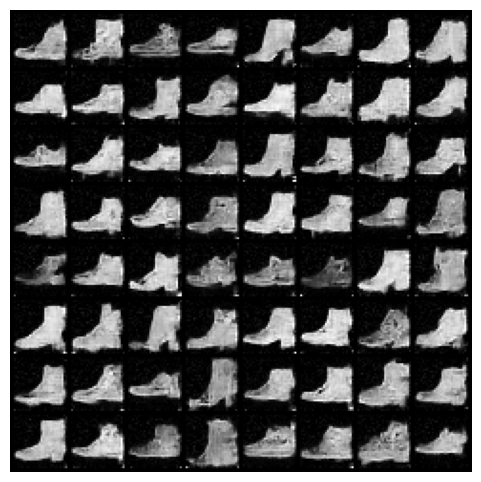

In [88]:
# Import necessary modules from torchvision.utils
from torchvision.utils import save_image, make_grid

# Load the pre-trained checkpoint from disk.
device = 'cuda:0'

# Iterate over digits (0 to 9)
for digit in range(0, 10):
    # Convert digit to PyTorch tensor and long type
    digit = torch.Tensor([digit])
    digit = digit.long()

    # Set the sample batch size and number of steps
    sample_batch_size = 64
    num_steps = 500
    # Use Euler_Maruyama_sampler_mnist as the sampler
    sampler = Euler_Maruyama_sampler_mnist

    # Generate samples using the specified sampler.
    samples = sampler(score_model,
                      marginal_prob_std_fn,
                      diffusion_coeff_fn,
                      sample_batch_size,
                      num_steps=num_steps,
                      device=device,
                      y=digit)

    # Sample visualization.
    samples = samples.clamp(0.0, 1.0)
    
    # Display the sample grid using matplotlib
    %matplotlib inline
    import matplotlib.pyplot as plt
    sample_grid = make_grid(samples, nrow=int(np.sqrt(sample_batch_size)))

    plt.figure(figsize=(6, 6))
    plt.axis('off')
    plt.imshow(sample_grid.permute(1, 2, 0).cpu(), vmin=0., vmax=1.)
    plt.show()

    # Save the sample grid as an image file
    save_image(sample_grid, f"./final/conditional_fashionmnist_{digit}.png")

### U-Net architecture for CIFAR10

In [89]:
# Define a time-dependent score-based model using U-Net architecture for CIFAR
class UNet_Transformer_cifar(nn.Module):
    """A time-dependent score-based model built upon U-Net architecture."""

    def __init__(self, marginal_prob_std, channels=[32, 64, 128, 256], embed_dim=256,
                 text_dim=256, nClass=10):

        """Args:
          marginal_prob_std: A function that takes time t and gives the standard
            deviation of the perturbation kernel p_{0t}(x(t) | x(0)).
          channels: The number of channels for feature maps of each resolution.
          embed_dim: The dimensionality of Gaussian random feature embeddings of time.
          text_dim:  the embedding dimension of text / digits.
          nClass:    number of classes you want to model.
        """
        super().__init__()

        # Gaussian random feature embedding layer for time
        self.time_embed = nn.Sequential(
            GaussianFourierProjection(embed_dim=embed_dim),
            nn.Linear(embed_dim, embed_dim)
        )

        # Encoding layers where the resolution decreases
        self.conv0 = nn.Conv2d(3, channels[0], 3, stride=1, bias=False, padding='same')
        self.dense0 = Dense(embed_dim, channels[0])
        self.gnorm0 = nn.GroupNorm(4, num_channels=channels[0])

        self.conv1 = nn.Conv2d(channels[0], channels[0], 3, stride=1, bias=False, padding='same')
        self.dense1 = Dense(embed_dim, channels[0])
        self.gnorm1 = nn.GroupNorm(4, num_channels=channels[0])

        self.conv2 = nn.Conv2d(channels[0], channels[1], 2, stride=2, bias=False)
        self.dense2 = Dense(embed_dim, channels[1])
        self.gnorm2 = nn.GroupNorm(32, num_channels=channels[1])

        self.conv3 = nn.Conv2d(channels[1], channels[2], 3, stride=1, bias=False, padding='same')
        self.dense3 = Dense(embed_dim, channels[2])
        self.gnorm3 = nn.GroupNorm(32, num_channels=channels[2])
        self.attn3 = SpatialTransformer(channels[2], text_dim)

        self.conv4 = nn.Conv2d(channels[2], channels[3], 2, stride=2, bias=False)
        self.dense4 = Dense(embed_dim, channels[3])
        self.gnorm4 = nn.GroupNorm(32, num_channels=channels[3])
        self.attn4 = SpatialTransformer(channels[3], text_dim)

        self.conv5 = nn.Conv2d(channels[3], channels[3], 2, stride=2, bias=False)
        self.dense5 = Dense(embed_dim, channels[3])
        self.gnorm5 = nn.GroupNorm(32, num_channels=channels[3])
        self.attn5 = SpatialTransformer(channels[3], text_dim)

        # Decoding layers where the resolution increases
        self.tconv5 = nn.ConvTranspose2d(channels[3], channels[3], 2, stride=2, bias=False)
        self.tdense5 = Dense(embed_dim, channels[3])
        self.tgnorm5 = nn.GroupNorm(32, num_channels=channels[3])

        self.tconv4 = nn.ConvTranspose2d(channels[3], channels[2], 2, stride=2, bias=False)
        self.tdense4 = Dense(embed_dim, channels[2])
        self.tgnorm4 = nn.GroupNorm(32, num_channels=channels[2])

        self.tconv3 = nn.ConvTranspose2d(channels[2], channels[1], 1, stride=1, bias=False)  # + channels[2]
        self.tdense3 = Dense(embed_dim, channels[1])
        self.tgnorm3 = nn.GroupNorm(32, num_channels=channels[1])

        self.tconv2 = nn.ConvTranspose2d(channels[1], channels[0], 2, stride=2, bias=False)  # + channels[1]
        self.tdense2 = Dense(embed_dim, channels[0])
        self.tgnorm2 = nn.GroupNorm(32, num_channels=channels[0])

        self.tconv1 = nn.ConvTranspose2d(channels[0], channels[0], 1, stride=1)  # + channels[0]
        self.tdense1 = Dense(embed_dim, channels[0])
        self.tgnorm1 = nn.GroupNorm(32, num_channels=channels[0])
        self.tconv0 = nn.ConvTranspose2d(channels[0], 3, 1, stride=1)

        # The swish activation function
        self.act = nn.SiLU()  # lambda x: x * torch.sigmoid(x)
        self.marginal_prob_std = marginal_prob_std
        self.cond_embed = nn.Embedding(nClass, text_dim)

    def forward(self, x, t, y=None):
        # Obtain the Gaussian random feature embedding for t
        embed = self.act(self.time_embed(t))
        y_embed = self.cond_embed(y).unsqueeze(1)

        # Encoding path
        h0 = self.conv0(x) + self.dense0(embed)
        h0 = self.act(self.gnorm0(h0))
        h1 = self.conv1(h0) + self.dense1(embed)
        h1 = self.act(self.gnorm1(h1))
        h2 = self.conv2(h1) + self.dense2(embed)
        h2 = self.act(self.gnorm2(h2))
        h3 = self.conv3(h2) + self.dense3(embed)
        h3 = self.act(self.gnorm3(h3))
        h3 = self.attn3(h3, y_embed)  # Use your attention layers
        h4 = self.conv4(h3) + self.dense4(embed)
        h4 = self.act(self.gnorm4(h4))
        h4 = self.attn4(h4, y_embed)
        h5 = self.conv5(h4) + self.dense5(embed)
        h5 = self.act(self.gnorm5(h5))
        h5 = self.attn5(h5, y_embed)

        # Decoding path
        h = self.tconv5(h5) + self.tdense5(embed)
        h = self.act(self.tgnorm5(h))
        h = self.tconv4(h + h4) + self.tdense4(embed)
        h = self.act(self.tgnorm4(h))
        h = self.tconv3(h + h3) + self.tdense3(embed)
        h = self.act(self.tgnorm3(h))
        h = self.tconv2(h + h2) + self.tdense2(embed)
        h = self.act(self.tgnorm2(h))
        h = self.tconv1(h + h1) + self.tdense2(embed)
        h = self.act(self.tgnorm1(h))
        h = self.tconv0(h + h0)

        # Normalize output
        h = h / self.marginal_prob_std(t)[:, None, None, None]
        return h

### Training loop for CIFAR10

In [92]:
# Create a DataParallel instance for the UNet_Transformer_cifar model
score_model = torch.nn.DataParallel(UNet_Transformer_cifar(marginal_prob_std=marginal_prob_std_fn))
score_model = score_model.to(device)

# Import necessary scheduler modules
from torch.optim.lr_scheduler import CosineAnnealingLR, MultiStepLR

# Set the number of epochs, batch size, and learning rate
n_epochs = 60
batch_size = 256
lr = 0.0003

# Load CIFAR-10 dataset
dataset = CIFAR10('.', train=True, transform=transforms.ToTensor(), download=True)
data_loader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=4)

# Initialize Adam optimizer with the model parameters and specified learning rate
optimizer = Adam(score_model.parameters(), lr=lr)

# Set up the learning rate scheduler
milestones = [5, 15, 25, 35, 60, 80, 100]
gamma = 0.7
cosine_scheduler = CosineAnnealingLR(optimizer, T_max=25, eta_min=0.001)
multistep = MultiStepLR(optimizer, milestones=milestones, gamma=gamma)
scheduler = cosine_scheduler

# Initialize tqdm progress bar for epochs
tqdm_epoch = trange(n_epochs)

# List to store conditional CIFAR-10 loss values
cond_cifar = []

# Main training loop
for epoch in tqdm_epoch:
    avg_loss = 0.
    num_items = 0

    # Iterate through data loader batches
    for x, y in tqdm(data_loader):
        x = x.to(device)
        # Calculate conditional loss using the defined function
        loss = loss_fn_cond(score_model, x, y, marginal_prob_std_fn)

        # Backpropagation and optimization step
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # Update average loss and item count
        avg_loss += loss.item() * x.shape[0]
        num_items += x.shape[0]

    # Adjust learning rate with the scheduler
    scheduler.step()

    # Append average loss to the list
    cond_cifar.append(avg_loss/num_items)

    # Adjust learning rate and scheduler at epoch 40
    if epoch == 40:
        for param_group in optimizer.param_groups:
            param_group['lr'] = 3e-4
        scheduler = multistep

    # Fetch current learning rate
    lr_current = optimizer.param_groups[0]['lr']

    # Print epoch details
    print('{} Average Loss: {:5f} lr {:.1e}'.format(epoch, avg_loss / num_items, lr_current))

    # Update the tqdm progress bar description
    tqdm_epoch.set_description('Average Loss: {:5f}'.format(avg_loss / num_items))

Files already downloaded and verified


  0%|          | 0/60 [00:00<?, ?it/s]


  0%|                                                   | 0/196 [00:00<?, ?it/s]/tmp/ipykernel_70766/2309205034.py:11: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(t, device=device)

100%|█████████████████████████████████████████| 196/196 [00:05<00:00, 32.91it/s]


0 Average Loss: 1484.566245 lr 3.0e-04



100%|█████████████████████████████████████████| 196/196 [00:05<00:00, 33.17it/s]


1 Average Loss: 301.592948 lr 3.1e-04



100%|█████████████████████████████████████████| 196/196 [00:05<00:00, 33.11it/s]


2 Average Loss: 182.057089 lr 3.2e-04



100%|█████████████████████████████████████████| 196/196 [00:05<00:00, 32.95it/s]


3 Average Loss: 132.650587 lr 3.4e-04



100%|█████████████████████████████████████████| 196/196 [00:06<00:00, 31.75it/s]


4 Average Loss: 107.681052 lr 3.7e-04



100%|█████████████████████████████████████████| 196/196 [00:05<00:00, 33.23it/s]


5 Average Loss: 93.476748 lr 3.9e-04



100%|█████████████████████████████████████████| 196/196 [00:05<00:00, 33.17it/s]


6 Average Loss: 84.414167 lr 4.3e-04



100%|█████████████████████████████████████████| 196/196 [00:05<00:00, 33.13it/s]


7 Average Loss: 78.043124 lr 4.6e-04



100%|█████████████████████████████████████████| 196/196 [00:05<00:00, 33.36it/s]


8 Average Loss: 74.029372 lr 5.0e-04



100%|█████████████████████████████████████████| 196/196 [00:06<00:00, 32.47it/s]


9 Average Loss: 72.522443 lr 5.4e-04



100%|█████████████████████████████████████████| 196/196 [00:06<00:00, 32.49it/s]


10 Average Loss: 69.862185 lr 5.8e-04



100%|█████████████████████████████████████████| 196/196 [00:06<00:00, 31.88it/s]


11 Average Loss: 68.093959 lr 6.3e-04



100%|█████████████████████████████████████████| 196/196 [00:06<00:00, 32.46it/s]


12 Average Loss: 66.312914 lr 6.7e-04



100%|█████████████████████████████████████████| 196/196 [00:05<00:00, 32.95it/s]


13 Average Loss: 65.658571 lr 7.2e-04



100%|█████████████████████████████████████████| 196/196 [00:05<00:00, 32.76it/s]


14 Average Loss: 65.104862 lr 7.6e-04



100%|█████████████████████████████████████████| 196/196 [00:05<00:00, 32.92it/s]


15 Average Loss: 63.283947 lr 8.0e-04



100%|█████████████████████████████████████████| 196/196 [00:05<00:00, 32.88it/s]


16 Average Loss: 62.838577 lr 8.4e-04



100%|█████████████████████████████████████████| 196/196 [00:05<00:00, 32.99it/s]


17 Average Loss: 62.928437 lr 8.7e-04



100%|█████████████████████████████████████████| 196/196 [00:05<00:00, 32.87it/s]


18 Average Loss: 61.226545 lr 9.1e-04



100%|█████████████████████████████████████████| 196/196 [00:06<00:00, 31.49it/s]


19 Average Loss: 61.792050 lr 9.3e-04



100%|█████████████████████████████████████████| 196/196 [00:05<00:00, 33.27it/s]


20 Average Loss: 62.336420 lr 9.6e-04



100%|█████████████████████████████████████████| 196/196 [00:05<00:00, 33.22it/s]


21 Average Loss: 61.345355 lr 9.8e-04



100%|█████████████████████████████████████████| 196/196 [00:06<00:00, 32.20it/s]


22 Average Loss: 60.612755 lr 9.9e-04



100%|█████████████████████████████████████████| 196/196 [00:05<00:00, 32.72it/s]


23 Average Loss: 59.366974 lr 1.0e-03



100%|█████████████████████████████████████████| 196/196 [00:05<00:00, 32.96it/s]


24 Average Loss: 59.796272 lr 1.0e-03



100%|█████████████████████████████████████████| 196/196 [00:06<00:00, 32.62it/s]


25 Average Loss: 60.477703 lr 1.0e-03



100%|█████████████████████████████████████████| 196/196 [00:06<00:00, 32.32it/s]


26 Average Loss: 59.821706 lr 9.9e-04



100%|█████████████████████████████████████████| 196/196 [00:06<00:00, 32.18it/s]


27 Average Loss: 59.995229 lr 9.8e-04



100%|█████████████████████████████████████████| 196/196 [00:05<00:00, 32.83it/s]


28 Average Loss: 59.342931 lr 9.6e-04



100%|█████████████████████████████████████████| 196/196 [00:05<00:00, 33.00it/s]


29 Average Loss: 59.536893 lr 9.3e-04



100%|█████████████████████████████████████████| 196/196 [00:05<00:00, 32.94it/s]


30 Average Loss: 58.266776 lr 9.1e-04



100%|█████████████████████████████████████████| 196/196 [00:05<00:00, 32.86it/s]


31 Average Loss: 56.732573 lr 8.7e-04



100%|█████████████████████████████████████████| 196/196 [00:05<00:00, 33.24it/s]


32 Average Loss: 58.428048 lr 8.4e-04



100%|█████████████████████████████████████████| 196/196 [00:05<00:00, 33.32it/s]


33 Average Loss: 58.689300 lr 8.0e-04



100%|█████████████████████████████████████████| 196/196 [00:06<00:00, 32.29it/s]


34 Average Loss: 58.030355 lr 7.6e-04



100%|█████████████████████████████████████████| 196/196 [00:05<00:00, 33.45it/s]


35 Average Loss: 56.999499 lr 7.2e-04



100%|█████████████████████████████████████████| 196/196 [00:06<00:00, 31.92it/s]


36 Average Loss: 56.261586 lr 6.7e-04



100%|█████████████████████████████████████████| 196/196 [00:05<00:00, 32.94it/s]


37 Average Loss: 56.628689 lr 6.3e-04



100%|█████████████████████████████████████████| 196/196 [00:05<00:00, 33.04it/s]


38 Average Loss: 56.472055 lr 5.8e-04



100%|█████████████████████████████████████████| 196/196 [00:05<00:00, 33.48it/s]


39 Average Loss: 56.110033 lr 5.4e-04



100%|█████████████████████████████████████████| 196/196 [00:06<00:00, 32.56it/s]


40 Average Loss: 56.390459 lr 3.0e-04



100%|█████████████████████████████████████████| 196/196 [00:05<00:00, 33.38it/s]


41 Average Loss: 56.411414 lr 3.0e-04



100%|█████████████████████████████████████████| 196/196 [00:06<00:00, 32.63it/s]


42 Average Loss: 55.921462 lr 3.0e-04



100%|█████████████████████████████████████████| 196/196 [00:05<00:00, 32.98it/s]


43 Average Loss: 55.315244 lr 3.0e-04



100%|█████████████████████████████████████████| 196/196 [00:05<00:00, 33.01it/s]


44 Average Loss: 55.609694 lr 3.0e-04



100%|█████████████████████████████████████████| 196/196 [00:06<00:00, 31.52it/s]


45 Average Loss: 54.686232 lr 2.1e-04



100%|█████████████████████████████████████████| 196/196 [00:06<00:00, 32.56it/s]


46 Average Loss: 54.212094 lr 2.1e-04



100%|█████████████████████████████████████████| 196/196 [00:05<00:00, 33.59it/s]


47 Average Loss: 54.757235 lr 2.1e-04



100%|█████████████████████████████████████████| 196/196 [00:06<00:00, 32.62it/s]


48 Average Loss: 54.470525 lr 2.1e-04



100%|█████████████████████████████████████████| 196/196 [00:05<00:00, 33.09it/s]


49 Average Loss: 53.949147 lr 2.1e-04



100%|█████████████████████████████████████████| 196/196 [00:06<00:00, 32.64it/s]


50 Average Loss: 54.579839 lr 2.1e-04



100%|█████████████████████████████████████████| 196/196 [00:06<00:00, 32.60it/s]


51 Average Loss: 54.475405 lr 2.1e-04



100%|█████████████████████████████████████████| 196/196 [00:06<00:00, 32.46it/s]


52 Average Loss: 54.430891 lr 2.1e-04



100%|█████████████████████████████████████████| 196/196 [00:05<00:00, 32.97it/s]


53 Average Loss: 55.926219 lr 2.1e-04



100%|█████████████████████████████████████████| 196/196 [00:06<00:00, 31.98it/s]


54 Average Loss: 53.924816 lr 2.1e-04



100%|█████████████████████████████████████████| 196/196 [00:05<00:00, 33.19it/s]


55 Average Loss: 54.299180 lr 1.5e-04



100%|█████████████████████████████████████████| 196/196 [00:05<00:00, 32.76it/s]


56 Average Loss: 53.706472 lr 1.5e-04



100%|█████████████████████████████████████████| 196/196 [00:05<00:00, 32.70it/s]


57 Average Loss: 53.853151 lr 1.5e-04



100%|█████████████████████████████████████████| 196/196 [00:05<00:00, 32.79it/s]


58 Average Loss: 54.811551 lr 1.5e-04



100%|█████████████████████████████████████████| 196/196 [00:06<00:00, 31.99it/s]

59 Average Loss: 54.271258 lr 1.5e-04


### Loss per epoch for CIFAR10

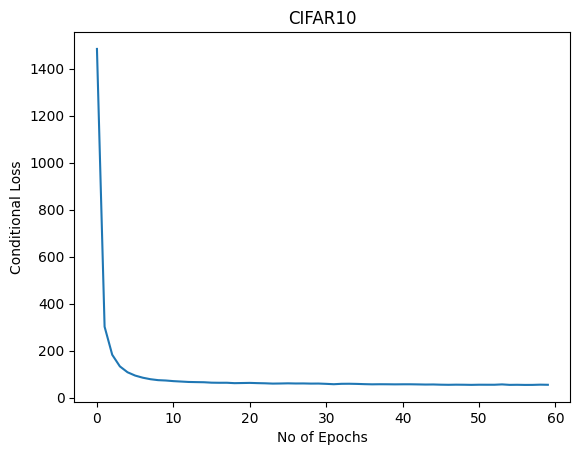

In [93]:
cond_cifar = np.array(cond_cifar)
plt.plot(cond_cifar)
plt.xlabel("No of Epochs")
plt.ylabel("Conditional Loss")
plt.title("CIFAR10")
plt.show()

### Sampler code for Conditional Generation of CIFAR10 Images

In [ ]:
# Import necessary functions
from torchvision.utils import save_image, make_grid

# Specify the device for processing (CUDA or CPU)
device = 'cuda:0' 

# Iterate over digits 0 to 9
for digit in range(0, 10):
    # Convert digit to a PyTorch tensor and then to a long tensor
    digit = torch.Tensor([digit])
    digit = digit.long()

    # Set sample batch size and number of steps for the sampler
    sample_batch_size = 64 
    num_steps = 500 

    # Use Euler_Maruyama_sampler_cifar as the sampler
    sampler = Euler_Maruyama_sampler_cifar

    # Generate samples using the specified sampler
    samples = sampler(score_model,
                      marginal_prob_std_fn,
                      diffusion_coeff_fn,
                      sample_batch_size,
                      num_steps=num_steps,
                      device=device,
                      y=digit)

    # Clamp generated samples to the range [0.0, 1.0]
    samples = samples.clamp(0.0, 1.0)

    # Visualize the generated samples using matplotlib
    %matplotlib inline
    import matplotlib.pyplot as plt
    sample_grid = make_grid(samples, nrow=int(np.sqrt(sample_batch_size)))

    # Display the sample grid
    plt.figure(figsize=(6, 6))
    plt.axis('off')
    plt.imshow(sample_grid.permute(1, 2, 0).cpu(), vmin=0., vmax=1.)
    plt.show()

    # Save the generated samples as an image
    save_image(sample_grid, f"./final/conditional_Cifarmnist_{digit}.png")

## Stable Diffusion on MNIST and FashionMNIST

### Autoencoder for Compressing Images to Latent Space 

In [11]:
import torch.nn as nn

class AutoEncoder(nn.Module):

    def __init__(self, channels=[4, 8, 32]):
        
        super().__init__()
        
        # Gaussian random feature embedding layer for time
        # Encoding layers where the resolution decreases
        self.encoder = nn.Sequential(
            nn.Conv2d(1, channels[0], 3, stride=1, bias=True),
            nn.BatchNorm2d(channels[0]),
            nn.SiLU(),
            nn.Conv2d(channels[0], channels[1], 3, stride=2, bias=True),
            nn.BatchNorm2d(channels[1]),
            nn.SiLU(),
            nn.Conv2d(channels[1], channels[2], 3, stride=1, bias=True),
            nn.BatchNorm2d(channels[2])
        )
        
        # Decoding layers where the resolution increases
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(channels[2], channels[1], 3, stride=1, bias=True),
            nn.BatchNorm2d(channels[1]),
            nn.SiLU(),
            nn.ConvTranspose2d(channels[1], channels[0], 3, stride=2, bias=True, output_padding=1),
            nn.BatchNorm2d(channels[0]),
            nn.SiLU(),
            nn.ConvTranspose2d(channels[0], 1, 3, stride=1, bias=True),
            nn.Sigmoid()
        )

    def forward(self, x):
        # Forward pass through the encoder and decoder
        output = self.encoder(x)
        output = self.decoder(output)
        return output


In [12]:
x_tmp = torch.randn(1,1,28,28)
print(AutoEncoder()(x_tmp).shape)
assert AutoEncoder()(x_tmp).shape == x_tmp.shape, "Check conv layer spec! the autoencoder input output shape not align"

torch.Size([1, 1, 28, 28])


### Loss function for AutoEncoder

In [13]:
from lpips import LPIPS
# Define the loss function, MSE and LPIPS
loss_fn_ae = lambda x,xhat: nn.functional.mse_loss(x, xhat) 

### Training of AutoEncoder using FashionMNIST samples

In [16]:
from torchvision import datasets

# Create an instance of the AutoEncoder class with specific channel configurations
ae_model = AutoEncoder([4, 4, 4]).cuda()

# Number of training epochs
n_epochs = 50  

# Size of a mini-batch
batch_size = 256  

# Learning rate
lr = 1e-4 

# Specify the device for training (CUDA in this case)
device = "cuda:0"

# Load FashionMNIST dataset from torchvision
dataset = datasets.FashionMNIST('.', train=True, transform=transforms.ToTensor(), download=True)

# Create a DataLoader to handle batching, shuffling, and loading data in parallel
data_loader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=0)

# List to store autoencoder loss for each epoch
auto_loss = []

# Adam optimizer for updating autoencoder parameters
optimizer = Adam(ae_model.parameters(), lr=lr)

# tqdm_epoch provides a progress bar for training epochs
tqdm_epoch = trange(n_epochs)

# Loop through epochs
for epoch in tqdm_epoch:
    avg_loss = 0.
    num_items = 0
    
    # Loop through batches in the DataLoader
    for x, y in data_loader:
        x = x.to(device)
        
        # Pass input through the encoder
        z = ae_model.encoder(x)
        
        # Pass the encoded representation through the decoder
        x_hat = ae_model.decoder(z)
        
        # Calculate the autoencoder loss
        loss = loss_fn_ae(x, x_hat)
        
        # Backpropagation and optimization step
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        # Update average loss and number of items processed
        avg_loss += loss.item() * x.shape[0]
        num_items += x.shape[0]
    
    # Calculate and store the average loss for the epoch
    auto_loss.append(avg_loss / num_items)
    
    # Print the average loss for the epoch
    print('{} Average Loss: {:5f}'.format(epoch, avg_loss / num_items))
    
    # Update the progress bar description
    tqdm_epoch.set_description('Average Loss: {:5f}'.format(avg_loss / num_items))
    
    # Save the checkpoint after each epoch of training
    torch.save(ae_model.state_dict(), 'ckpt_ae.pth')


  0%|          | 0/50 [00:00<?, ?it/s]

0 Average Loss: 0.055479
1 Average Loss: 0.022865
2 Average Loss: 0.016028
3 Average Loss: 0.013847
4 Average Loss: 0.012853
5 Average Loss: 0.012130
6 Average Loss: 0.011450
7 Average Loss: 0.010812
8 Average Loss: 0.010361
9 Average Loss: 0.009961
10 Average Loss: 0.009704
11 Average Loss: 0.009478
12 Average Loss: 0.009317
13 Average Loss: 0.009161
14 Average Loss: 0.008999
15 Average Loss: 0.008871
16 Average Loss: 0.008765
17 Average Loss: 0.008658
18 Average Loss: 0.008566
19 Average Loss: 0.008485
20 Average Loss: 0.008418
21 Average Loss: 0.008337
22 Average Loss: 0.008304
23 Average Loss: 0.008245
24 Average Loss: 0.008186
25 Average Loss: 0.008108
26 Average Loss: 0.008040
27 Average Loss: 0.008007
28 Average Loss: 0.007926
29 Average Loss: 0.007890
30 Average Loss: 0.007865
31 Average Loss: 0.007792
32 Average Loss: 0.007746
33 Average Loss: 0.007665
34 Average Loss: 0.007630
35 Average Loss: 0.007586
36 Average Loss: 0.007524
37 Average Loss: 0.007472
38 Average Loss: 0.007

### Loss per epoch for AutoEncoder

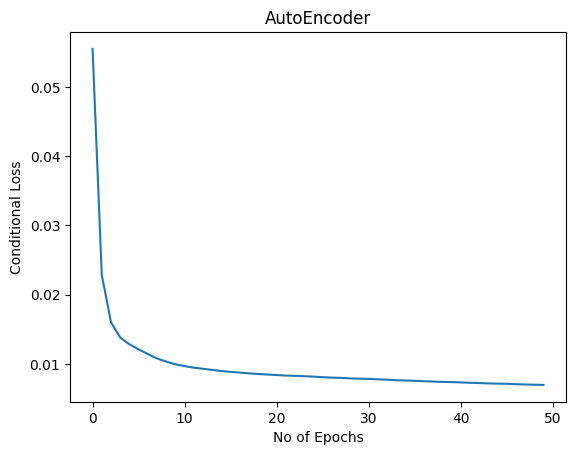

In [22]:
auto_loss = np.array(auto_loss)
plt.plot(auto_loss)
plt.xlabel("No of Epochs")
plt.ylabel("Conditional Loss")
plt.title("AutoEncoder")
plt.show()

### Visualization of AutoEncoder Input and Output

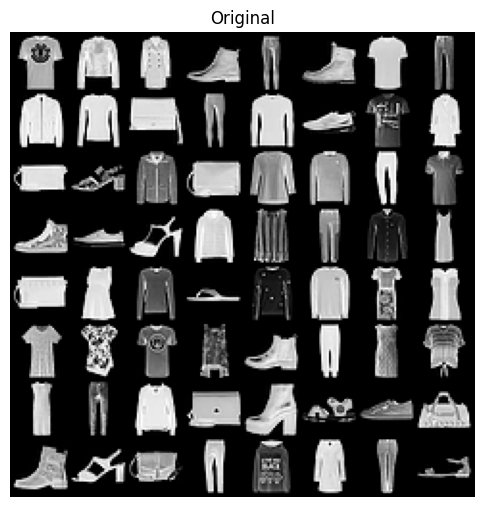

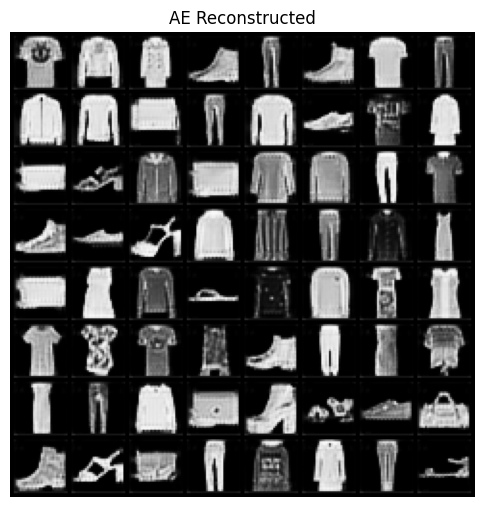

In [17]:
# Set the model to evaluation mode
ae_model.eval()

# Load a batch of data from the DataLoader
x, y = next(iter(data_loader))

# Pass the batch through the trained autoencoder and move the result to CPU
x_hat = ae_model(x.to(device)).cpu()

# Display the original images in a grid
plt.figure(figsize=(6, 6.5))
plt.axis('off')
plt.imshow(make_grid(x[:64, :, :, :].cpu()).permute([1, 2, 0]), vmin=0., vmax=1.)
plt.title("Original")
plt.show()

# Display the reconstructed images by the autoencoder in a grid
plt.figure(figsize=(6, 6.5))
plt.axis('off')
plt.imshow(make_grid(x_hat[:64, :, :, :].cpu()).permute([1, 2, 0]), vmin=0., vmax=1.)
plt.title("AE Reconstructed")
plt.show()


### Creating the Latent Space Datasets for MNIST and FashionMNIST

In [64]:
# Set the batch size for data loading
batch_size = 256

# Create FashionMNIST and MNIST datasets with specified transformations
dataset1 = datasets.FashionMNIST('.', train=True, transform=transforms.ToTensor(), download=True)
dataset2 = datasets.MNIST('.', train=True, transform=transforms.ToTensor(), download=True)

# Create a DataLoader for MNIST dataset with specified batch size and other settings
data_loader = DataLoader(dataset2, batch_size=batch_size, shuffle=False, num_workers=4)

# Set the requires_grad attribute of the autoencoder model to False
ae_model.requires_grad_(False)

# Set the model to evaluation mode
ae_model.eval()

# Initialize empty lists to store encoded representations and corresponding labels
zs = []
ys = []

# Iterate over the DataLoader to encode images and collect labels
for x, y in tqdm(data_loader):
  # Encode the images using the autoencoder's encoder and move the result to CPU
  z = ae_model.encoder(x.to(device)).cpu()
  # Append the encoded representations and labels to the lists
  zs.append(z)
  ys.append(y)

# Concatenate the encoded representations and labels along the specified dimension
zdata = torch.cat(zs, )
ydata = torch.cat(ys, )

  0%|          | 0/235 [00:00<?, ?it/s]

In [65]:
print(zdata.shape)
print(ydata.shape)
print(zdata.mean(), zdata.var())

torch.Size([60000, 4, 10, 10])
torch.Size([60000])
tensor(-0.7693) tensor(0.9064)


In [66]:
from torch.utils.data import TensorDataset
latent_dataset = TensorDataset(zdata, ydata)

### Latent U-Net Architecture for MNIST and FashionMNIST

In [67]:
# Define a class for the Latent UNet Transformer model
class Latent_UNet_Tranformer(nn.Module):
    """A time-dependent score-based model built upon U-Net architecture."""

    def __init__(self, marginal_prob_std, channels=[4, 64, 128, 256], embed_dim=256,
                 text_dim=256, nClass=10):
        """Initialize a time-dependent score-based network.

        Args:
          marginal_prob_std: A function that takes time t and gives the standard
            deviation of the perturbation kernel p_{0t}(x(t) | x(0)).
          channels: The number of channels for feature maps of each resolution.
          embed_dim: The dimensionality of Gaussian random feature embeddings.
        """
        super().__init__()
        # Gaussian random feature embedding layer for time
        self.time_embed = nn.Sequential(
            GaussianFourierProjection(embed_dim=embed_dim),
            nn.Linear(embed_dim, embed_dim))
        # Encoding layers where the resolution decreases
        self.conv1 = nn.Conv2d(channels[0], channels[1], 3, stride=1, bias=False)
        self.dense1 = Dense(embed_dim, channels[1])
        self.gnorm1 = nn.GroupNorm(4, num_channels=channels[1])
        self.conv2 = nn.Conv2d(channels[1], channels[2], 3, stride=2, bias=False)
        self.dense2 = Dense(embed_dim, channels[2])
        self.gnorm2 = nn.GroupNorm(4, num_channels=channels[2])
        self.attn2 = SpatialTransformer(channels[2], text_dim)
        self.conv3 = nn.Conv2d(channels[2], channels[3], 3, stride=2, bias=False)
        self.dense3 = Dense(embed_dim, channels[3])
        self.gnorm3 = nn.GroupNorm(4, num_channels=channels[3])
        self.attn3 = SpatialTransformer(channels[3], text_dim)

        self.tconv3 = nn.ConvTranspose2d(channels[3], channels[2], 3, stride=2, bias=False)
        self.dense6 = Dense(embed_dim, channels[2])
        self.tgnorm3 = nn.GroupNorm(4, num_channels=channels[2])
        self.attn6 = SpatialTransformer(channels[2], text_dim)
        self.tconv2 = nn.ConvTranspose2d(channels[2], channels[1], 3, stride=2, bias=False, output_padding=1)     # + channels[2]
        self.dense7 = Dense(embed_dim, channels[1])
        self.tgnorm2 = nn.GroupNorm(4, num_channels=channels[1])
        self.tconv1 = nn.ConvTranspose2d(channels[1], channels[0], 3, stride=1) # + channels[1]

        # The swish activation function
        self.act = nn.SiLU() # lambda x: x * torch.sigmoid(x)
        self.marginal_prob_std = marginal_prob_std
        self.cond_embed = nn.Embedding(nClass, text_dim)

    def forward(self, x, t, y=None):
        # Obtain the Gaussian random feature embedding for t
        embed = self.act(self.time_embed(t))
        y_embed = self.cond_embed(y).unsqueeze(1)
        # Encoding path
        ## Incorporate information from t
        h1 = self.conv1(x) + self.dense1(embed)
        ## Group normalization
        h1 = self.act(self.gnorm1(h1))
        h2 = self.conv2(h1) + self.dense2(embed)
        h2 = self.act(self.gnorm2(h2))
        h2 = self.attn2(h2, y_embed)
        h3 = self.conv3(h2) + self.dense3(embed)
        h3 = self.act(self.gnorm3(h3))
        h3 = self.attn3(h3, y_embed)

        # Decoding path
        ## Skip connection from the encoding path
        h = self.tconv3(h3) + self.dense6(embed)
        h = self.act(self.tgnorm3(h))
        h = self.attn6(h, y_embed)
        h = self.tconv2(h + h2)
        h += self.dense7(embed)
        h = self.act(self.tgnorm2(h))
        h = self.tconv1(h + h1)

        # Normalize output
        h = h / self.marginal_prob_std(t)[:, None, None, None]
        return h


### Training Latent Diffusion Model

In [ ]:
#Training Latent diffusion model

# Define a DataParallel wrapper for the Latent UNet Transformer model
latent_score_model = torch.nn.DataParallel(
    Latent_UNet_Tranformer(marginal_prob_std=marginal_prob_std_fn,
                           channels=[4, 16, 32, 64], )
)
# Move the model to the specified device
latent_score_model = latent_score_model.to(device)

# Set the number of training epochs
n_epochs = 100 
## size of a mini-batch
# Set the batch size
batch_size = 256
## learning rate
# Set the learning rate
lr = 1e-4 

# Create a data loader for the latent dataset
latent_data_loader = DataLoader(latent_dataset, batch_size=batch_size, shuffle=True, )
# Set the model to training mode
latent_score_model.train()

# Initialize Adam optimizer for the model parameters
optimizer = Adam(latent_score_model.parameters(), lr=lr)
# Create a learning rate scheduler using LambdaLR
scheduler = LambdaLR(optimizer, lr_lambda=lambda epoch: max(0.5, 0.995 ** epoch))
# Initialize tqdm for visualizing training progress
tqdm_epoch = trange(n_epochs)
# List to store the training loss for each epoch
latent_loss_mnist = []

# Training loop
for epoch in tqdm_epoch:
    avg_loss = 0.
    num_items = 0
    # Iterate over batches in the data loader
    for z, y in latent_data_loader:
        # Move the latent variable z to the specified device
        z = z.to(device)
        # Compute the conditional loss using the latent score model
        loss = loss_fn_cond(latent_score_model, z, y, marginal_prob_std_fn)
        # Zero the gradients
        optimizer.zero_grad()
        # Backpropagate the loss
        loss.backward()
        # Update the model parameters
        optimizer.step()
        avg_loss += loss.item() * z.shape[0]
        num_items += z.shape[0]
    # Adjust the learning rate using the scheduler
    scheduler.step()
    # Append the averaged loss for the epoch to the list
    latent_loss_mnist.append(avg_loss/num_items)
    lr_current = scheduler.get_last_lr()[0]
    # Print the epoch, averaged loss, and current learning rate
    print('{} Average Loss: {:5f} lr {:.1e}'.format(epoch, avg_loss / num_items, lr_current))
    # Update the tqdm description with the averaged loss
    tqdm_epoch.set_description('Average Loss: {:5f}'.format(avg_loss / num_items))
    # Save the model checkpoint after each epoch of training
    torch.save(latent_score_model.state_dict(), 'ckpt_latent_diff_transformer.pth')


  0%|          | 0/100 [00:00<?, ?it/s]

/tmp/ipykernel_276063/2309205034.py:11: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(t, device=device)


0 Average Loss: 421.630155 lr 1.0e-04
1 Average Loss: 299.592221 lr 9.9e-05
2 Average Loss: 244.797362 lr 9.9e-05
3 Average Loss: 214.368688 lr 9.8e-05
4 Average Loss: 194.069762 lr 9.8e-05
5 Average Loss: 180.969685 lr 9.7e-05
6 Average Loss: 170.424017 lr 9.7e-05
7 Average Loss: 163.050170 lr 9.6e-05
8 Average Loss: 156.795685 lr 9.6e-05
9 Average Loss: 151.304867 lr 9.5e-05
10 Average Loss: 146.584255 lr 9.5e-05
11 Average Loss: 142.083653 lr 9.4e-05
12 Average Loss: 137.474512 lr 9.4e-05
13 Average Loss: 133.774805 lr 9.3e-05
14 Average Loss: 129.997977 lr 9.3e-05
15 Average Loss: 126.103066 lr 9.2e-05
16 Average Loss: 122.821141 lr 9.2e-05
17 Average Loss: 120.010014 lr 9.1e-05
18 Average Loss: 116.950106 lr 9.1e-05
19 Average Loss: 113.854210 lr 9.0e-05
20 Average Loss: 111.521795 lr 9.0e-05
21 Average Loss: 109.004650 lr 9.0e-05
22 Average Loss: 107.219552 lr 8.9e-05
23 Average Loss: 105.296404 lr 8.9e-05
24 Average Loss: 103.647238 lr 8.8e-05
25 Average Loss: 101.580214 lr 8.8e

### Loss per epoch for Stable Diffusion on FashionMNIST

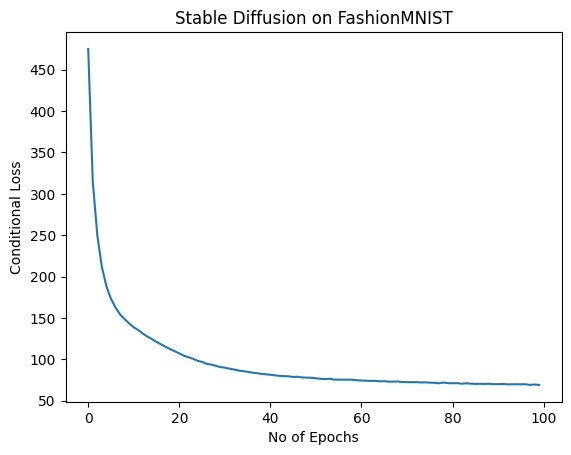

In [60]:
latent_loss_mnist = np.array(latent_loss_mnist)
plt.plot(latent_loss_mnist)
plt.xlabel("No of Epochs")
plt.ylabel("Conditional Loss")
plt.title("Stable Diffusion on MNIST")
plt.show()

## Sampler Code for Generation of Images using Stable Diffusion on FashionMNIST

/tmp/ipykernel_276063/2309205034.py:11: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(t, device=device)


  0%|          | 0/500 [00:00<?, ?it/s]

/tmp/ipykernel_276063/2309205034.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(sigma**t, device=device)


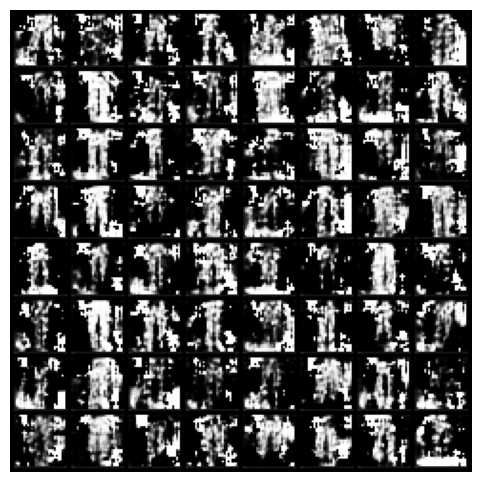

In [63]:
sample_batch_size = 64 
num_steps = 500
# Set the sampler to Euler-Maruyama for MNIST
sampler = Euler_Maruyama_sampler_mnist
# Set the latent score model to evaluation mode
latent_score_model.eval()
# Specify the digit for conditional generation
digit = torch.Tensor([0])
digit = digit.long()

## Generate samples using the specified sampler.
# Use the latent score model to generate samples with the specified configuration
samples_z = sampler(latent_score_model,
        marginal_prob_std_fn,
        diffusion_coeff_fn,
        sample_batch_size,
        num_steps=num_steps,
        device=device,
        x_shape=(4,10,10),
        y=digit)

## Sample visualization.
# Decode the generated samples using the autoencoder's decoder
decoder_samples = ae_model.decoder(samples_z).clamp(0.0, 1.0)
# Create a grid of the decoded samples for visualization
sample_grid = make_grid(decoder_samples, nrow=int(np.sqrt(sample_batch_size)))
# Display the sample grid
%matplotlib inline
import matplotlib.pyplot as plt

plt.figure(figsize=(6,6))
plt.axis('off')
plt.imshow(sample_grid.permute(1, 2, 0).cpu(), vmin=0., vmax=1.)
plt.show()

# Save the sample grid as an image file
from torchvision.utils import save_image, make_grid
save_image(sample_grid, f"./final/stable_dif_MNIST{0}.png")
